# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

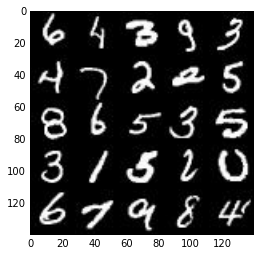

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

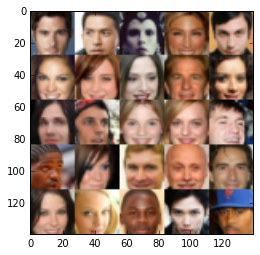

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.8.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')

    learn_rate = tf.placeholder(tf.float32, name='learn_rate')
    
    return inputs_real, inputs_z , learn_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse= not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
      
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
 
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
    
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [48]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    #alpha = 0.2
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [49]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [57]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [63]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    n_samples, width, height, channels = data_shape
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    steps = 0
    show_every =100
    print_every = 10
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})

                if steps % show_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/5... Discriminator Loss: 0.7672... Generator Loss: 11.0087
Epoch 0/5... Discriminator Loss: 0.9548... Generator Loss: 12.7950
Epoch 0/5... Discriminator Loss: 1.0651... Generator Loss: 1.3663
Epoch 0/5... Discriminator Loss: 1.7700... Generator Loss: 0.6615
Epoch 0/5... Discriminator Loss: 0.5864... Generator Loss: 1.0024
Epoch 0/5... Discriminator Loss: 0.4542... Generator Loss: 1.3108
Epoch 0/5... Discriminator Loss: 0.7658... Generator Loss: 4.5886
Epoch 0/5... Discriminator Loss: 2.1635... Generator Loss: 0.2881
Epoch 0/5... Discriminator Loss: 0.3273... Generator Loss: 3.7622


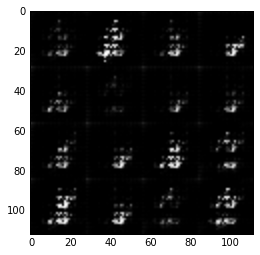

Epoch 0/5... Discriminator Loss: 0.4864... Generator Loss: 1.8378
Epoch 0/5... Discriminator Loss: 0.2457... Generator Loss: 2.4193
Epoch 0/5... Discriminator Loss: 0.4162... Generator Loss: 1.9695
Epoch 0/5... Discriminator Loss: 0.4217... Generator Loss: 2.9292
Epoch 0/5... Discriminator Loss: 0.7241... Generator Loss: 1.0971
Epoch 0/5... Discriminator Loss: 0.7305... Generator Loss: 2.3156
Epoch 0/5... Discriminator Loss: 2.2723... Generator Loss: 4.9727
Epoch 0/5... Discriminator Loss: 0.7795... Generator Loss: 1.5918
Epoch 0/5... Discriminator Loss: 0.5113... Generator Loss: 2.7034
Epoch 0/5... Discriminator Loss: 0.4342... Generator Loss: 2.1769


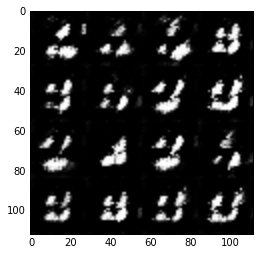

Epoch 0/5... Discriminator Loss: 0.3081... Generator Loss: 2.0620
Epoch 0/5... Discriminator Loss: 0.3396... Generator Loss: 2.4203
Epoch 0/5... Discriminator Loss: 1.5032... Generator Loss: 0.5032
Epoch 0/5... Discriminator Loss: 0.7702... Generator Loss: 1.1548
Epoch 0/5... Discriminator Loss: 0.9861... Generator Loss: 0.8252
Epoch 0/5... Discriminator Loss: 0.6039... Generator Loss: 3.1457
Epoch 0/5... Discriminator Loss: 1.0956... Generator Loss: 2.4798
Epoch 0/5... Discriminator Loss: 2.1113... Generator Loss: 6.5653
Epoch 0/5... Discriminator Loss: 0.7683... Generator Loss: 1.5140
Epoch 0/5... Discriminator Loss: 0.8244... Generator Loss: 1.0961


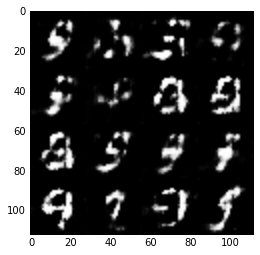

Epoch 0/5... Discriminator Loss: 0.8138... Generator Loss: 2.0406
Epoch 0/5... Discriminator Loss: 0.9531... Generator Loss: 2.1921
Epoch 0/5... Discriminator Loss: 0.9307... Generator Loss: 1.3203
Epoch 0/5... Discriminator Loss: 0.8019... Generator Loss: 0.9997
Epoch 0/5... Discriminator Loss: 0.7666... Generator Loss: 1.9590
Epoch 0/5... Discriminator Loss: 0.7226... Generator Loss: 1.6230
Epoch 0/5... Discriminator Loss: 0.7681... Generator Loss: 2.0640
Epoch 0/5... Discriminator Loss: 1.3960... Generator Loss: 0.4768
Epoch 0/5... Discriminator Loss: 0.9207... Generator Loss: 1.4662
Epoch 0/5... Discriminator Loss: 1.0235... Generator Loss: 0.7589


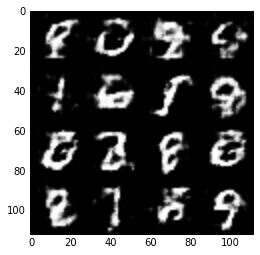

Epoch 0/5... Discriminator Loss: 1.0509... Generator Loss: 0.6358
Epoch 0/5... Discriminator Loss: 1.0047... Generator Loss: 1.5413
Epoch 0/5... Discriminator Loss: 0.9478... Generator Loss: 1.7083
Epoch 0/5... Discriminator Loss: 0.9010... Generator Loss: 2.0478
Epoch 0/5... Discriminator Loss: 0.9206... Generator Loss: 0.9090
Epoch 0/5... Discriminator Loss: 0.9628... Generator Loss: 1.4491
Epoch 0/5... Discriminator Loss: 1.2848... Generator Loss: 0.4519
Epoch 1/5... Discriminator Loss: 0.9980... Generator Loss: 0.8559
Epoch 1/5... Discriminator Loss: 0.8248... Generator Loss: 1.1075
Epoch 1/5... Discriminator Loss: 0.8648... Generator Loss: 1.8489


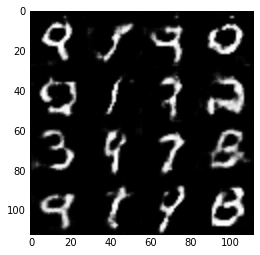

Epoch 1/5... Discriminator Loss: 0.8505... Generator Loss: 0.9560
Epoch 1/5... Discriminator Loss: 1.3322... Generator Loss: 0.5627
Epoch 1/5... Discriminator Loss: 0.8746... Generator Loss: 1.0702
Epoch 1/5... Discriminator Loss: 0.9082... Generator Loss: 1.0401
Epoch 1/5... Discriminator Loss: 0.9851... Generator Loss: 1.0427
Epoch 1/5... Discriminator Loss: 1.0436... Generator Loss: 0.9233
Epoch 1/5... Discriminator Loss: 0.9874... Generator Loss: 0.7928
Epoch 1/5... Discriminator Loss: 1.0805... Generator Loss: 0.9642
Epoch 1/5... Discriminator Loss: 1.1771... Generator Loss: 0.5882
Epoch 1/5... Discriminator Loss: 1.1391... Generator Loss: 0.6294


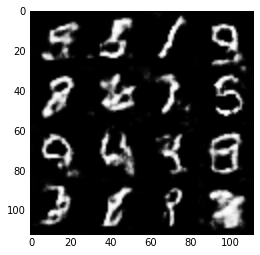

Epoch 1/5... Discriminator Loss: 1.1507... Generator Loss: 0.6201
Epoch 1/5... Discriminator Loss: 0.9699... Generator Loss: 1.5241
Epoch 1/5... Discriminator Loss: 0.9828... Generator Loss: 1.1913
Epoch 1/5... Discriminator Loss: 1.0037... Generator Loss: 1.1234
Epoch 1/5... Discriminator Loss: 1.3731... Generator Loss: 2.3260
Epoch 1/5... Discriminator Loss: 1.1680... Generator Loss: 0.5597
Epoch 1/5... Discriminator Loss: 1.0888... Generator Loss: 1.3864
Epoch 1/5... Discriminator Loss: 1.1100... Generator Loss: 0.9528
Epoch 1/5... Discriminator Loss: 1.0205... Generator Loss: 1.6431
Epoch 1/5... Discriminator Loss: 0.9314... Generator Loss: 0.9443


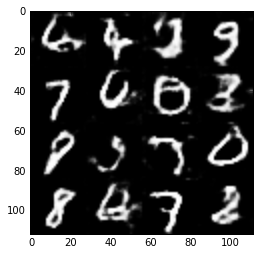

Epoch 1/5... Discriminator Loss: 1.1442... Generator Loss: 2.1586
Epoch 1/5... Discriminator Loss: 1.0884... Generator Loss: 1.4980
Epoch 1/5... Discriminator Loss: 0.9608... Generator Loss: 1.1995
Epoch 1/5... Discriminator Loss: 1.1542... Generator Loss: 0.6233
Epoch 1/5... Discriminator Loss: 1.4400... Generator Loss: 0.3823
Epoch 1/5... Discriminator Loss: 0.9450... Generator Loss: 0.9017
Epoch 1/5... Discriminator Loss: 0.9724... Generator Loss: 1.0135
Epoch 1/5... Discriminator Loss: 1.1234... Generator Loss: 1.2362
Epoch 1/5... Discriminator Loss: 1.2959... Generator Loss: 2.4218
Epoch 1/5... Discriminator Loss: 1.4719... Generator Loss: 0.3936


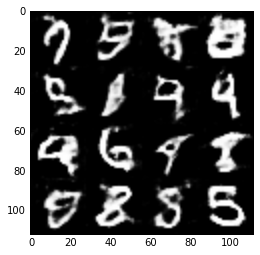

Epoch 1/5... Discriminator Loss: 1.0325... Generator Loss: 1.5196
Epoch 1/5... Discriminator Loss: 0.9353... Generator Loss: 1.2805
Epoch 1/5... Discriminator Loss: 1.5135... Generator Loss: 0.3447
Epoch 1/5... Discriminator Loss: 0.9833... Generator Loss: 1.0710
Epoch 1/5... Discriminator Loss: 1.5699... Generator Loss: 0.3138
Epoch 1/5... Discriminator Loss: 1.0616... Generator Loss: 1.1036
Epoch 1/5... Discriminator Loss: 1.0665... Generator Loss: 0.6181
Epoch 1/5... Discriminator Loss: 0.9921... Generator Loss: 0.7836
Epoch 1/5... Discriminator Loss: 1.0611... Generator Loss: 0.7615
Epoch 1/5... Discriminator Loss: 1.1205... Generator Loss: 0.5433


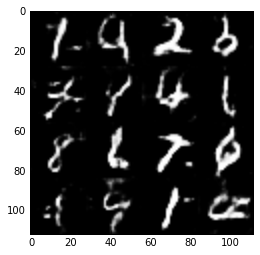

Epoch 1/5... Discriminator Loss: 1.0892... Generator Loss: 1.5673
Epoch 1/5... Discriminator Loss: 0.9760... Generator Loss: 0.8504
Epoch 1/5... Discriminator Loss: 1.0154... Generator Loss: 0.7221
Epoch 1/5... Discriminator Loss: 1.3056... Generator Loss: 0.4801
Epoch 2/5... Discriminator Loss: 1.1151... Generator Loss: 0.5346
Epoch 2/5... Discriminator Loss: 1.1212... Generator Loss: 1.0980
Epoch 2/5... Discriminator Loss: 1.0434... Generator Loss: 1.1793
Epoch 2/5... Discriminator Loss: 0.9541... Generator Loss: 0.9915
Epoch 2/5... Discriminator Loss: 1.1537... Generator Loss: 0.5417
Epoch 2/5... Discriminator Loss: 0.8212... Generator Loss: 0.9499


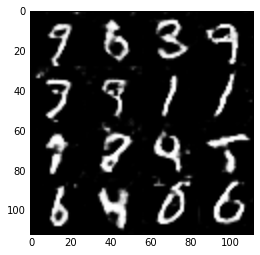

Epoch 2/5... Discriminator Loss: 1.0840... Generator Loss: 1.6336
Epoch 2/5... Discriminator Loss: 1.0230... Generator Loss: 0.6983
Epoch 2/5... Discriminator Loss: 1.0679... Generator Loss: 0.6650
Epoch 2/5... Discriminator Loss: 1.0771... Generator Loss: 1.1240
Epoch 2/5... Discriminator Loss: 1.1719... Generator Loss: 0.5060
Epoch 2/5... Discriminator Loss: 1.1052... Generator Loss: 0.6061
Epoch 2/5... Discriminator Loss: 1.5502... Generator Loss: 0.3320
Epoch 2/5... Discriminator Loss: 1.0103... Generator Loss: 0.6774
Epoch 2/5... Discriminator Loss: 1.7088... Generator Loss: 3.2555
Epoch 2/5... Discriminator Loss: 0.9100... Generator Loss: 1.5517


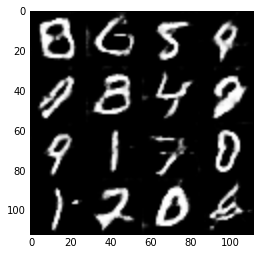

Epoch 2/5... Discriminator Loss: 0.9487... Generator Loss: 1.0224
Epoch 2/5... Discriminator Loss: 1.2582... Generator Loss: 0.5253
Epoch 2/5... Discriminator Loss: 1.3058... Generator Loss: 0.4769
Epoch 2/5... Discriminator Loss: 1.4106... Generator Loss: 0.3712
Epoch 2/5... Discriminator Loss: 1.0955... Generator Loss: 0.8794
Epoch 2/5... Discriminator Loss: 1.1224... Generator Loss: 1.3978
Epoch 2/5... Discriminator Loss: 1.4331... Generator Loss: 0.4060
Epoch 2/5... Discriminator Loss: 1.4739... Generator Loss: 0.3558
Epoch 2/5... Discriminator Loss: 1.1937... Generator Loss: 0.4767
Epoch 2/5... Discriminator Loss: 1.1962... Generator Loss: 0.5942


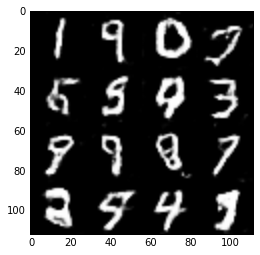

Epoch 2/5... Discriminator Loss: 1.1364... Generator Loss: 1.7986
Epoch 2/5... Discriminator Loss: 0.9213... Generator Loss: 1.7189
Epoch 2/5... Discriminator Loss: 0.9784... Generator Loss: 0.7558
Epoch 2/5... Discriminator Loss: 1.6012... Generator Loss: 0.3167
Epoch 2/5... Discriminator Loss: 0.8385... Generator Loss: 0.8793
Epoch 2/5... Discriminator Loss: 1.0590... Generator Loss: 1.9989
Epoch 2/5... Discriminator Loss: 1.8583... Generator Loss: 0.2453
Epoch 2/5... Discriminator Loss: 0.9301... Generator Loss: 1.3143
Epoch 2/5... Discriminator Loss: 0.9233... Generator Loss: 1.1275
Epoch 2/5... Discriminator Loss: 1.5018... Generator Loss: 0.4126


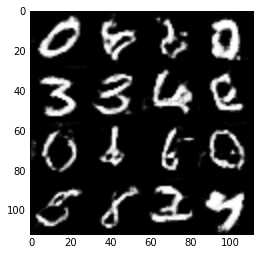

Epoch 2/5... Discriminator Loss: 1.0131... Generator Loss: 0.7625
Epoch 2/5... Discriminator Loss: 0.9327... Generator Loss: 2.0933
Epoch 2/5... Discriminator Loss: 0.6802... Generator Loss: 1.1970
Epoch 2/5... Discriminator Loss: 1.5382... Generator Loss: 2.7828
Epoch 2/5... Discriminator Loss: 1.9119... Generator Loss: 0.2055
Epoch 2/5... Discriminator Loss: 1.5287... Generator Loss: 0.3433
Epoch 2/5... Discriminator Loss: 1.0963... Generator Loss: 0.5658
Epoch 2/5... Discriminator Loss: 1.6980... Generator Loss: 0.3182
Epoch 2/5... Discriminator Loss: 0.9451... Generator Loss: 1.3197
Epoch 2/5... Discriminator Loss: 1.0748... Generator Loss: 0.7315


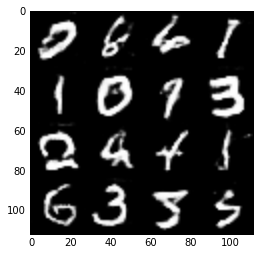

Epoch 2/5... Discriminator Loss: 0.9522... Generator Loss: 1.7958
Epoch 3/5... Discriminator Loss: 1.1648... Generator Loss: 0.7040
Epoch 3/5... Discriminator Loss: 1.2977... Generator Loss: 1.5816
Epoch 3/5... Discriminator Loss: 1.3218... Generator Loss: 0.5008
Epoch 3/5... Discriminator Loss: 1.1542... Generator Loss: 0.5909
Epoch 3/5... Discriminator Loss: 0.9957... Generator Loss: 1.8781
Epoch 3/5... Discriminator Loss: 0.9772... Generator Loss: 1.0548
Epoch 3/5... Discriminator Loss: 0.8161... Generator Loss: 1.3438
Epoch 3/5... Discriminator Loss: 0.5858... Generator Loss: 1.4681
Epoch 3/5... Discriminator Loss: 1.4488... Generator Loss: 2.9952


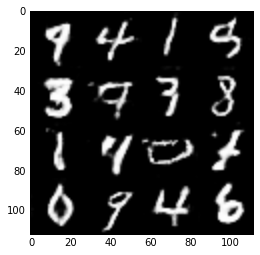

Epoch 3/5... Discriminator Loss: 1.1034... Generator Loss: 0.6264
Epoch 3/5... Discriminator Loss: 1.6689... Generator Loss: 0.2872
Epoch 3/5... Discriminator Loss: 0.8392... Generator Loss: 1.0496
Epoch 3/5... Discriminator Loss: 1.0159... Generator Loss: 2.3471
Epoch 3/5... Discriminator Loss: 0.8973... Generator Loss: 0.8159
Epoch 3/5... Discriminator Loss: 0.8267... Generator Loss: 0.7946
Epoch 3/5... Discriminator Loss: 0.9560... Generator Loss: 0.8605
Epoch 3/5... Discriminator Loss: 1.1363... Generator Loss: 0.6068
Epoch 3/5... Discriminator Loss: 0.8298... Generator Loss: 0.9450
Epoch 3/5... Discriminator Loss: 0.6358... Generator Loss: 1.3223


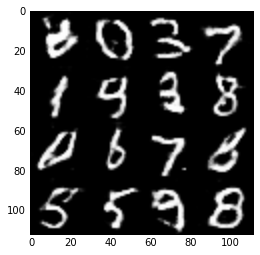

Epoch 3/5... Discriminator Loss: 2.3201... Generator Loss: 0.1661
Epoch 3/5... Discriminator Loss: 1.6249... Generator Loss: 0.3168
Epoch 3/5... Discriminator Loss: 0.8117... Generator Loss: 1.3046
Epoch 3/5... Discriminator Loss: 1.0915... Generator Loss: 0.6085
Epoch 3/5... Discriminator Loss: 1.0189... Generator Loss: 0.6261
Epoch 3/5... Discriminator Loss: 0.8677... Generator Loss: 0.8634
Epoch 3/5... Discriminator Loss: 1.2628... Generator Loss: 0.5693
Epoch 3/5... Discriminator Loss: 0.8494... Generator Loss: 1.3056
Epoch 3/5... Discriminator Loss: 1.3193... Generator Loss: 2.5225
Epoch 3/5... Discriminator Loss: 0.8997... Generator Loss: 0.8843


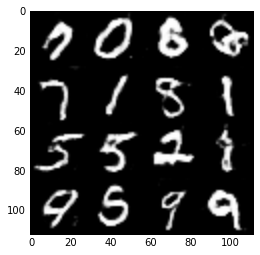

Epoch 3/5... Discriminator Loss: 0.8069... Generator Loss: 2.0976
Epoch 3/5... Discriminator Loss: 0.9616... Generator Loss: 0.8542
Epoch 3/5... Discriminator Loss: 1.2278... Generator Loss: 0.5173
Epoch 3/5... Discriminator Loss: 0.7895... Generator Loss: 0.8618
Epoch 3/5... Discriminator Loss: 0.9936... Generator Loss: 1.2553
Epoch 3/5... Discriminator Loss: 1.1623... Generator Loss: 0.6032
Epoch 3/5... Discriminator Loss: 0.7675... Generator Loss: 1.5809
Epoch 3/5... Discriminator Loss: 1.0494... Generator Loss: 0.7530
Epoch 3/5... Discriminator Loss: 1.6850... Generator Loss: 0.2985
Epoch 3/5... Discriminator Loss: 0.9001... Generator Loss: 1.2337


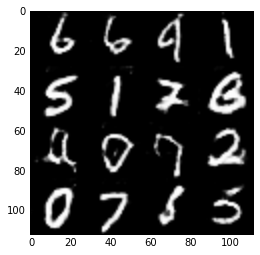

Epoch 3/5... Discriminator Loss: 0.9844... Generator Loss: 0.8181
Epoch 3/5... Discriminator Loss: 1.9754... Generator Loss: 0.2185
Epoch 3/5... Discriminator Loss: 1.5761... Generator Loss: 0.3373
Epoch 3/5... Discriminator Loss: 1.1301... Generator Loss: 2.2277
Epoch 3/5... Discriminator Loss: 1.0210... Generator Loss: 1.1152
Epoch 3/5... Discriminator Loss: 0.7990... Generator Loss: 1.1358
Epoch 3/5... Discriminator Loss: 1.0707... Generator Loss: 0.7028
Epoch 3/5... Discriminator Loss: 1.5960... Generator Loss: 0.3237
Epoch 4/5... Discriminator Loss: 0.8080... Generator Loss: 1.1657
Epoch 4/5... Discriminator Loss: 1.7429... Generator Loss: 3.6436


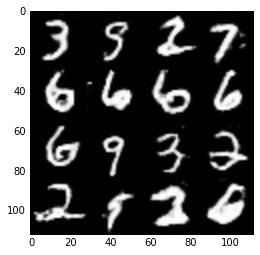

Epoch 4/5... Discriminator Loss: 1.1137... Generator Loss: 0.9847
Epoch 4/5... Discriminator Loss: 0.5778... Generator Loss: 1.3314
Epoch 4/5... Discriminator Loss: 1.4134... Generator Loss: 2.6819
Epoch 4/5... Discriminator Loss: 2.1214... Generator Loss: 0.1942
Epoch 4/5... Discriminator Loss: 0.7924... Generator Loss: 1.2044
Epoch 4/5... Discriminator Loss: 1.7824... Generator Loss: 0.2926
Epoch 4/5... Discriminator Loss: 0.9573... Generator Loss: 0.8800
Epoch 4/5... Discriminator Loss: 1.0282... Generator Loss: 0.6829
Epoch 4/5... Discriminator Loss: 1.3213... Generator Loss: 0.4306
Epoch 4/5... Discriminator Loss: 1.2128... Generator Loss: 0.6516


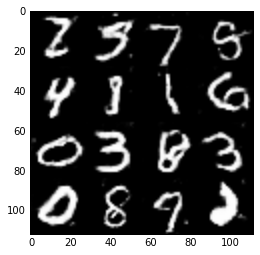

Epoch 4/5... Discriminator Loss: 2.0697... Generator Loss: 0.2267
Epoch 4/5... Discriminator Loss: 0.9721... Generator Loss: 1.1717
Epoch 4/5... Discriminator Loss: 0.8145... Generator Loss: 0.8667
Epoch 4/5... Discriminator Loss: 0.7892... Generator Loss: 0.8250
Epoch 4/5... Discriminator Loss: 0.8248... Generator Loss: 1.1897
Epoch 4/5... Discriminator Loss: 0.8388... Generator Loss: 1.0741
Epoch 4/5... Discriminator Loss: 1.4026... Generator Loss: 0.4518
Epoch 4/5... Discriminator Loss: 0.9452... Generator Loss: 0.7166
Epoch 4/5... Discriminator Loss: 1.4239... Generator Loss: 0.3942
Epoch 4/5... Discriminator Loss: 1.8189... Generator Loss: 0.2787


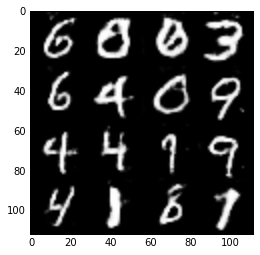

Epoch 4/5... Discriminator Loss: 2.1778... Generator Loss: 0.2052
Epoch 4/5... Discriminator Loss: 1.0238... Generator Loss: 0.7166
Epoch 4/5... Discriminator Loss: 1.2960... Generator Loss: 0.4755
Epoch 4/5... Discriminator Loss: 1.1647... Generator Loss: 2.2233
Epoch 4/5... Discriminator Loss: 0.6849... Generator Loss: 1.1729
Epoch 4/5... Discriminator Loss: 0.7026... Generator Loss: 1.0018
Epoch 4/5... Discriminator Loss: 0.5423... Generator Loss: 1.3824
Epoch 4/5... Discriminator Loss: 0.4034... Generator Loss: 1.6720
Epoch 4/5... Discriminator Loss: 0.9265... Generator Loss: 3.2708
Epoch 4/5... Discriminator Loss: 1.0299... Generator Loss: 2.6408


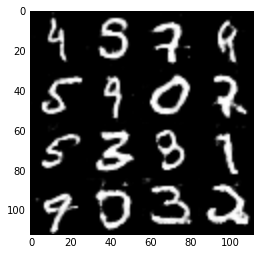

Epoch 4/5... Discriminator Loss: 0.8785... Generator Loss: 0.9250
Epoch 4/5... Discriminator Loss: 0.5528... Generator Loss: 1.5447
Epoch 4/5... Discriminator Loss: 2.3145... Generator Loss: 0.2123
Epoch 4/5... Discriminator Loss: 0.6111... Generator Loss: 1.9568
Epoch 4/5... Discriminator Loss: 1.0603... Generator Loss: 1.3271
Epoch 4/5... Discriminator Loss: 1.0809... Generator Loss: 0.6427
Epoch 4/5... Discriminator Loss: 0.7485... Generator Loss: 1.1437
Epoch 4/5... Discriminator Loss: 1.6972... Generator Loss: 0.3338
Epoch 4/5... Discriminator Loss: 1.2614... Generator Loss: 2.2368
Epoch 4/5... Discriminator Loss: 1.1489... Generator Loss: 2.2876


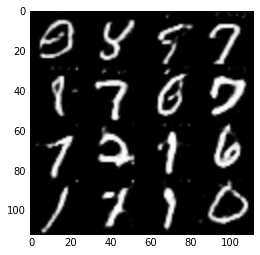

Epoch 4/5... Discriminator Loss: 0.8532... Generator Loss: 1.3570
Epoch 4/5... Discriminator Loss: 0.5245... Generator Loss: 1.5152
Epoch 4/5... Discriminator Loss: 1.9190... Generator Loss: 0.2968
Epoch 4/5... Discriminator Loss: 0.8855... Generator Loss: 0.8891
Epoch 4/5... Discriminator Loss: 1.0198... Generator Loss: 0.7340


In [67]:
batch_size = 128
z_dim = 150
learning_rate = 0.001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/5... Discriminator Loss: 0.1646... Generator Loss: 5.3143
Epoch 0/5... Discriminator Loss: 5.3060... Generator Loss: 0.0108
Epoch 0/5... Discriminator Loss: 1.8183... Generator Loss: 4.0382
Epoch 0/5... Discriminator Loss: 0.8428... Generator Loss: 2.4664
Epoch 0/5... Discriminator Loss: 0.6413... Generator Loss: 1.0268
Epoch 0/5... Discriminator Loss: 0.6848... Generator Loss: 1.0034
Epoch 0/5... Discriminator Loss: 1.3157... Generator Loss: 0.3962
Epoch 0/5... Discriminator Loss: 0.7576... Generator Loss: 3.3996
Epoch 0/5... Discriminator Loss: 0.8219... Generator Loss: 3.1781


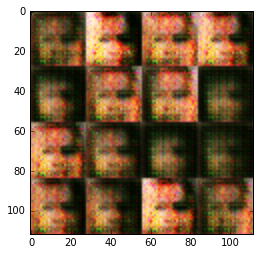

Epoch 0/5... Discriminator Loss: 1.1780... Generator Loss: 1.8166
Epoch 0/5... Discriminator Loss: 1.4543... Generator Loss: 0.5678
Epoch 0/5... Discriminator Loss: 2.0838... Generator Loss: 0.4228
Epoch 0/5... Discriminator Loss: 2.2811... Generator Loss: 3.5728
Epoch 0/5... Discriminator Loss: 1.2196... Generator Loss: 0.6442
Epoch 0/5... Discriminator Loss: 0.8372... Generator Loss: 1.1941
Epoch 0/5... Discriminator Loss: 1.3019... Generator Loss: 0.9087
Epoch 0/5... Discriminator Loss: 1.2596... Generator Loss: 0.7375
Epoch 0/5... Discriminator Loss: 1.1302... Generator Loss: 1.0885
Epoch 0/5... Discriminator Loss: 1.4295... Generator Loss: 1.5110


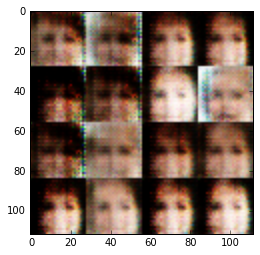

Epoch 0/5... Discriminator Loss: 1.1411... Generator Loss: 1.5280
Epoch 0/5... Discriminator Loss: 1.4594... Generator Loss: 0.8886
Epoch 0/5... Discriminator Loss: 1.6911... Generator Loss: 0.6972
Epoch 0/5... Discriminator Loss: 1.1188... Generator Loss: 1.1538
Epoch 0/5... Discriminator Loss: 1.2783... Generator Loss: 0.8889
Epoch 0/5... Discriminator Loss: 1.5194... Generator Loss: 0.4980
Epoch 0/5... Discriminator Loss: 1.1075... Generator Loss: 0.8594
Epoch 0/5... Discriminator Loss: 1.1111... Generator Loss: 0.9420
Epoch 0/5... Discriminator Loss: 1.0737... Generator Loss: 0.7631
Epoch 0/5... Discriminator Loss: 1.1237... Generator Loss: 1.0697


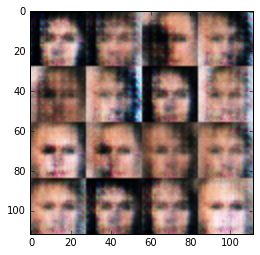

Epoch 0/5... Discriminator Loss: 1.2122... Generator Loss: 0.7518
Epoch 0/5... Discriminator Loss: 1.8337... Generator Loss: 0.2815
Epoch 0/5... Discriminator Loss: 1.2694... Generator Loss: 0.7102
Epoch 0/5... Discriminator Loss: 1.1979... Generator Loss: 0.6398
Epoch 0/5... Discriminator Loss: 1.2559... Generator Loss: 0.7232
Epoch 0/5... Discriminator Loss: 1.6012... Generator Loss: 0.3738
Epoch 0/5... Discriminator Loss: 0.9734... Generator Loss: 0.8342
Epoch 0/5... Discriminator Loss: 1.8556... Generator Loss: 2.4923
Epoch 0/5... Discriminator Loss: 1.1209... Generator Loss: 0.9296
Epoch 0/5... Discriminator Loss: 1.3917... Generator Loss: 0.7096


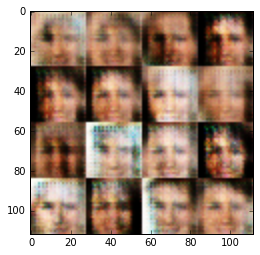

Epoch 0/5... Discriminator Loss: 1.8575... Generator Loss: 0.2904
Epoch 0/5... Discriminator Loss: 1.1235... Generator Loss: 0.9910
Epoch 0/5... Discriminator Loss: 1.2687... Generator Loss: 0.8992
Epoch 0/5... Discriminator Loss: 1.3614... Generator Loss: 1.7806
Epoch 0/5... Discriminator Loss: 1.3209... Generator Loss: 0.4723
Epoch 0/5... Discriminator Loss: 0.9777... Generator Loss: 0.9308
Epoch 0/5... Discriminator Loss: 2.0724... Generator Loss: 0.2568
Epoch 0/5... Discriminator Loss: 0.9559... Generator Loss: 0.8784
Epoch 0/5... Discriminator Loss: 1.4830... Generator Loss: 1.9498
Epoch 0/5... Discriminator Loss: 1.2051... Generator Loss: 0.6648


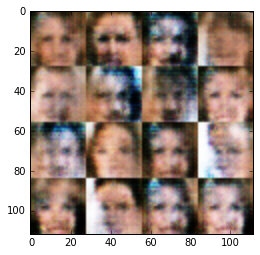

Epoch 0/5... Discriminator Loss: 1.0664... Generator Loss: 1.2200
Epoch 0/5... Discriminator Loss: 2.1265... Generator Loss: 0.1616
Epoch 0/5... Discriminator Loss: 1.0677... Generator Loss: 1.4299
Epoch 0/5... Discriminator Loss: 0.9710... Generator Loss: 0.9613
Epoch 0/5... Discriminator Loss: 1.2638... Generator Loss: 0.7006
Epoch 0/5... Discriminator Loss: 1.5869... Generator Loss: 0.3400
Epoch 0/5... Discriminator Loss: 1.3698... Generator Loss: 1.4600
Epoch 0/5... Discriminator Loss: 1.5269... Generator Loss: 1.8322
Epoch 0/5... Discriminator Loss: 1.8620... Generator Loss: 0.2333
Epoch 0/5... Discriminator Loss: 1.1078... Generator Loss: 0.7277


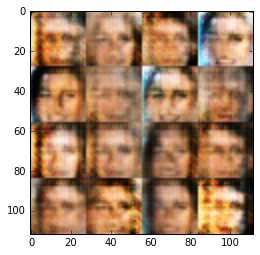

Epoch 0/5... Discriminator Loss: 1.1200... Generator Loss: 0.9769
Epoch 0/5... Discriminator Loss: 1.5846... Generator Loss: 0.7439
Epoch 0/5... Discriminator Loss: 0.9397... Generator Loss: 1.6216
Epoch 0/5... Discriminator Loss: 0.8382... Generator Loss: 1.0839
Epoch 0/5... Discriminator Loss: 1.2688... Generator Loss: 0.8021
Epoch 0/5... Discriminator Loss: 0.9519... Generator Loss: 1.1418
Epoch 0/5... Discriminator Loss: 1.1059... Generator Loss: 0.7347
Epoch 0/5... Discriminator Loss: 1.0698... Generator Loss: 1.4413
Epoch 0/5... Discriminator Loss: 1.0635... Generator Loss: 0.8743
Epoch 0/5... Discriminator Loss: 1.3300... Generator Loss: 0.6232


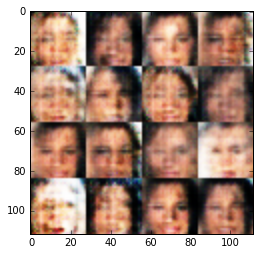

Epoch 0/5... Discriminator Loss: 1.1854... Generator Loss: 0.7797
Epoch 0/5... Discriminator Loss: 1.1756... Generator Loss: 1.3097
Epoch 0/5... Discriminator Loss: 1.1798... Generator Loss: 0.5898
Epoch 0/5... Discriminator Loss: 1.1310... Generator Loss: 1.0599
Epoch 0/5... Discriminator Loss: 1.3464... Generator Loss: 0.4895
Epoch 0/5... Discriminator Loss: 1.3406... Generator Loss: 0.6448
Epoch 0/5... Discriminator Loss: 1.1522... Generator Loss: 1.2163
Epoch 0/5... Discriminator Loss: 1.3942... Generator Loss: 1.4995
Epoch 0/5... Discriminator Loss: 1.1275... Generator Loss: 0.8161
Epoch 0/5... Discriminator Loss: 1.0802... Generator Loss: 0.7955


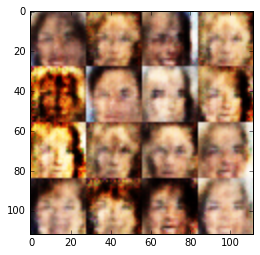

Epoch 0/5... Discriminator Loss: 0.9782... Generator Loss: 0.8270
Epoch 0/5... Discriminator Loss: 1.2004... Generator Loss: 0.5222
Epoch 0/5... Discriminator Loss: 1.1934... Generator Loss: 1.3393
Epoch 0/5... Discriminator Loss: 1.2044... Generator Loss: 1.3689
Epoch 0/5... Discriminator Loss: 1.3239... Generator Loss: 0.4779
Epoch 0/5... Discriminator Loss: 1.2816... Generator Loss: 0.6703
Epoch 0/5... Discriminator Loss: 1.2031... Generator Loss: 0.8359
Epoch 0/5... Discriminator Loss: 1.1383... Generator Loss: 0.7982
Epoch 0/5... Discriminator Loss: 1.0706... Generator Loss: 0.7306
Epoch 0/5... Discriminator Loss: 1.2606... Generator Loss: 1.8079


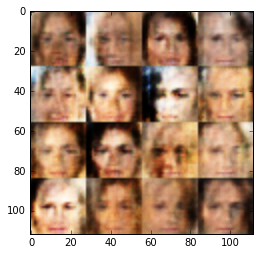

Epoch 0/5... Discriminator Loss: 1.2357... Generator Loss: 1.5412
Epoch 0/5... Discriminator Loss: 1.1557... Generator Loss: 1.0085
Epoch 0/5... Discriminator Loss: 1.0420... Generator Loss: 1.0031
Epoch 0/5... Discriminator Loss: 2.1657... Generator Loss: 2.8772
Epoch 0/5... Discriminator Loss: 1.5522... Generator Loss: 1.5452
Epoch 0/5... Discriminator Loss: 1.7149... Generator Loss: 0.2881
Epoch 0/5... Discriminator Loss: 1.2381... Generator Loss: 0.9627
Epoch 0/5... Discriminator Loss: 1.6203... Generator Loss: 1.5143
Epoch 0/5... Discriminator Loss: 1.1717... Generator Loss: 1.0403
Epoch 0/5... Discriminator Loss: 1.1725... Generator Loss: 1.2994


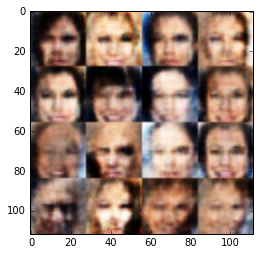

Epoch 0/5... Discriminator Loss: 1.0800... Generator Loss: 0.8106
Epoch 0/5... Discriminator Loss: 1.1415... Generator Loss: 0.7638
Epoch 0/5... Discriminator Loss: 1.2188... Generator Loss: 0.6291
Epoch 0/5... Discriminator Loss: 1.1922... Generator Loss: 1.2549
Epoch 0/5... Discriminator Loss: 1.2238... Generator Loss: 1.2711
Epoch 0/5... Discriminator Loss: 1.1893... Generator Loss: 1.9138
Epoch 0/5... Discriminator Loss: 1.6157... Generator Loss: 0.3115
Epoch 0/5... Discriminator Loss: 1.2295... Generator Loss: 0.9169
Epoch 0/5... Discriminator Loss: 1.5335... Generator Loss: 0.3466
Epoch 0/5... Discriminator Loss: 1.1577... Generator Loss: 0.7831


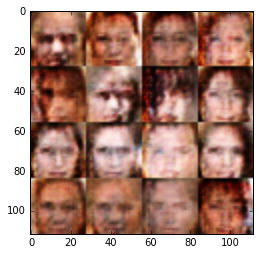

Epoch 0/5... Discriminator Loss: 1.1978... Generator Loss: 0.6914
Epoch 0/5... Discriminator Loss: 1.2569... Generator Loss: 0.7143
Epoch 0/5... Discriminator Loss: 1.3113... Generator Loss: 0.6962
Epoch 0/5... Discriminator Loss: 1.0901... Generator Loss: 0.9959
Epoch 0/5... Discriminator Loss: 1.3115... Generator Loss: 0.5271
Epoch 0/5... Discriminator Loss: 1.7087... Generator Loss: 0.2751
Epoch 0/5... Discriminator Loss: 1.1574... Generator Loss: 0.7523
Epoch 0/5... Discriminator Loss: 1.3280... Generator Loss: 0.5118
Epoch 0/5... Discriminator Loss: 1.2394... Generator Loss: 0.7013
Epoch 0/5... Discriminator Loss: 1.4711... Generator Loss: 0.4719


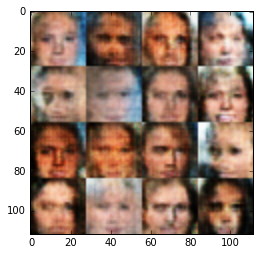

Epoch 0/5... Discriminator Loss: 1.2279... Generator Loss: 0.6103
Epoch 0/5... Discriminator Loss: 1.1588... Generator Loss: 1.2554
Epoch 0/5... Discriminator Loss: 1.2549... Generator Loss: 1.3875
Epoch 0/5... Discriminator Loss: 1.1496... Generator Loss: 0.7329
Epoch 0/5... Discriminator Loss: 1.1764... Generator Loss: 0.6422
Epoch 0/5... Discriminator Loss: 1.1794... Generator Loss: 0.8115
Epoch 0/5... Discriminator Loss: 1.5746... Generator Loss: 1.8517
Epoch 0/5... Discriminator Loss: 1.2797... Generator Loss: 0.5591
Epoch 0/5... Discriminator Loss: 1.1476... Generator Loss: 1.1235
Epoch 0/5... Discriminator Loss: 1.1499... Generator Loss: 0.6371


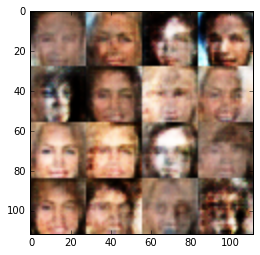

Epoch 0/5... Discriminator Loss: 1.4586... Generator Loss: 2.0037
Epoch 0/5... Discriminator Loss: 1.3036... Generator Loss: 0.5445
Epoch 0/5... Discriminator Loss: 1.1308... Generator Loss: 1.2713
Epoch 0/5... Discriminator Loss: 1.2954... Generator Loss: 0.4933
Epoch 0/5... Discriminator Loss: 1.4159... Generator Loss: 1.5116
Epoch 0/5... Discriminator Loss: 1.1828... Generator Loss: 0.6480
Epoch 0/5... Discriminator Loss: 1.0262... Generator Loss: 1.5612
Epoch 0/5... Discriminator Loss: 1.2209... Generator Loss: 1.3006
Epoch 0/5... Discriminator Loss: 1.3118... Generator Loss: 0.6376
Epoch 0/5... Discriminator Loss: 1.1024... Generator Loss: 1.0465


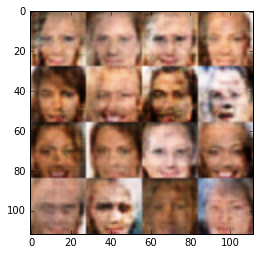

Epoch 0/5... Discriminator Loss: 1.2886... Generator Loss: 0.6702
Epoch 0/5... Discriminator Loss: 1.1753... Generator Loss: 0.7391
Epoch 0/5... Discriminator Loss: 1.3485... Generator Loss: 0.5505
Epoch 0/5... Discriminator Loss: 1.1762... Generator Loss: 0.6471
Epoch 0/5... Discriminator Loss: 1.2012... Generator Loss: 0.8105
Epoch 0/5... Discriminator Loss: 1.0320... Generator Loss: 1.0231
Epoch 0/5... Discriminator Loss: 1.1243... Generator Loss: 1.0827
Epoch 0/5... Discriminator Loss: 1.0467... Generator Loss: 1.6266
Epoch 0/5... Discriminator Loss: 1.1219... Generator Loss: 1.1390
Epoch 0/5... Discriminator Loss: 1.1027... Generator Loss: 0.9828


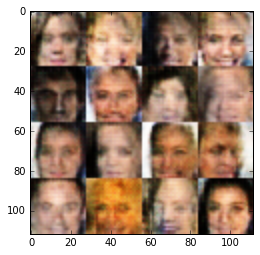

Epoch 0/5... Discriminator Loss: 1.3127... Generator Loss: 2.1114
Epoch 0/5... Discriminator Loss: 1.0348... Generator Loss: 0.9810
Epoch 0/5... Discriminator Loss: 1.1320... Generator Loss: 0.8508
Epoch 0/5... Discriminator Loss: 1.1587... Generator Loss: 1.4978
Epoch 0/5... Discriminator Loss: 0.9107... Generator Loss: 1.2090
Epoch 0/5... Discriminator Loss: 1.1679... Generator Loss: 1.3406
Epoch 0/5... Discriminator Loss: 1.2088... Generator Loss: 1.5011
Epoch 0/5... Discriminator Loss: 1.2105... Generator Loss: 0.7189
Epoch 0/5... Discriminator Loss: 1.4501... Generator Loss: 0.4048
Epoch 1/5... Discriminator Loss: 1.1625... Generator Loss: 0.8243


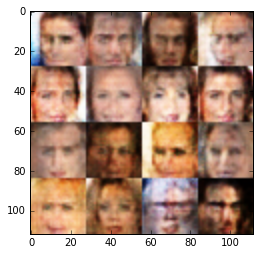

Epoch 1/5... Discriminator Loss: 1.3346... Generator Loss: 0.5412
Epoch 1/5... Discriminator Loss: 1.1429... Generator Loss: 0.6840
Epoch 1/5... Discriminator Loss: 1.1229... Generator Loss: 0.7415
Epoch 1/5... Discriminator Loss: 1.2297... Generator Loss: 0.7848
Epoch 1/5... Discriminator Loss: 1.2724... Generator Loss: 0.8302
Epoch 1/5... Discriminator Loss: 1.0717... Generator Loss: 1.1909
Epoch 1/5... Discriminator Loss: 1.1159... Generator Loss: 0.9244
Epoch 1/5... Discriminator Loss: 1.3310... Generator Loss: 0.4922
Epoch 1/5... Discriminator Loss: 1.1855... Generator Loss: 1.4977
Epoch 1/5... Discriminator Loss: 1.1635... Generator Loss: 0.9279


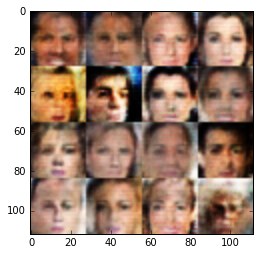

Epoch 1/5... Discriminator Loss: 1.2295... Generator Loss: 1.5596
Epoch 1/5... Discriminator Loss: 1.4900... Generator Loss: 1.3330
Epoch 1/5... Discriminator Loss: 1.0677... Generator Loss: 1.0916
Epoch 1/5... Discriminator Loss: 1.1848... Generator Loss: 1.3744
Epoch 1/5... Discriminator Loss: 1.2445... Generator Loss: 0.5693
Epoch 1/5... Discriminator Loss: 1.2023... Generator Loss: 0.7659
Epoch 1/5... Discriminator Loss: 1.3529... Generator Loss: 0.4611
Epoch 1/5... Discriminator Loss: 1.2120... Generator Loss: 0.5876
Epoch 1/5... Discriminator Loss: 1.2101... Generator Loss: 0.7697
Epoch 1/5... Discriminator Loss: 1.1205... Generator Loss: 1.0326


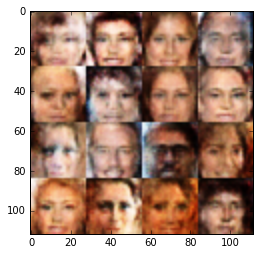

Epoch 1/5... Discriminator Loss: 1.2402... Generator Loss: 1.1138
Epoch 1/5... Discriminator Loss: 1.1696... Generator Loss: 0.9149
Epoch 1/5... Discriminator Loss: 1.1082... Generator Loss: 1.1476
Epoch 1/5... Discriminator Loss: 1.2181... Generator Loss: 0.6732
Epoch 1/5... Discriminator Loss: 1.0965... Generator Loss: 1.1298
Epoch 1/5... Discriminator Loss: 1.2296... Generator Loss: 1.3704
Epoch 1/5... Discriminator Loss: 1.1947... Generator Loss: 0.7121
Epoch 1/5... Discriminator Loss: 1.1457... Generator Loss: 0.9519
Epoch 1/5... Discriminator Loss: 1.1027... Generator Loss: 1.4659
Epoch 1/5... Discriminator Loss: 1.2402... Generator Loss: 0.5447


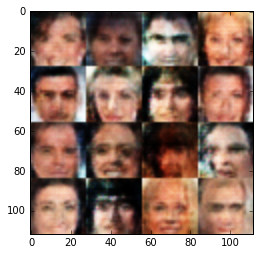

Epoch 1/5... Discriminator Loss: 0.9709... Generator Loss: 1.4382
Epoch 1/5... Discriminator Loss: 1.2968... Generator Loss: 0.5670
Epoch 1/5... Discriminator Loss: 1.2516... Generator Loss: 1.1528
Epoch 1/5... Discriminator Loss: 1.3418... Generator Loss: 0.4758
Epoch 1/5... Discriminator Loss: 1.1688... Generator Loss: 0.7956
Epoch 1/5... Discriminator Loss: 1.0173... Generator Loss: 0.8634
Epoch 1/5... Discriminator Loss: 1.1284... Generator Loss: 1.3713
Epoch 1/5... Discriminator Loss: 1.3363... Generator Loss: 1.1599
Epoch 1/5... Discriminator Loss: 1.2355... Generator Loss: 0.6708
Epoch 1/5... Discriminator Loss: 1.3290... Generator Loss: 0.5038


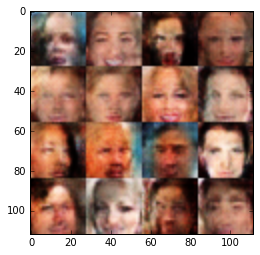

Epoch 1/5... Discriminator Loss: 1.0895... Generator Loss: 0.8420
Epoch 1/5... Discriminator Loss: 1.1320... Generator Loss: 1.0189
Epoch 1/5... Discriminator Loss: 1.2138... Generator Loss: 0.5929
Epoch 1/5... Discriminator Loss: 1.4255... Generator Loss: 0.4192
Epoch 1/5... Discriminator Loss: 1.1428... Generator Loss: 0.8956
Epoch 1/5... Discriminator Loss: 1.0499... Generator Loss: 1.0815
Epoch 1/5... Discriminator Loss: 1.1883... Generator Loss: 0.7863
Epoch 1/5... Discriminator Loss: 1.5851... Generator Loss: 0.3154
Epoch 1/5... Discriminator Loss: 1.4055... Generator Loss: 0.4285
Epoch 1/5... Discriminator Loss: 1.0217... Generator Loss: 0.9239


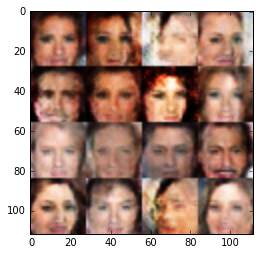

Epoch 1/5... Discriminator Loss: 1.1030... Generator Loss: 1.0983
Epoch 1/5... Discriminator Loss: 1.3542... Generator Loss: 0.4600
Epoch 1/5... Discriminator Loss: 1.2576... Generator Loss: 0.5462
Epoch 1/5... Discriminator Loss: 1.7094... Generator Loss: 0.2571
Epoch 1/5... Discriminator Loss: 1.0668... Generator Loss: 0.8698
Epoch 1/5... Discriminator Loss: 1.0557... Generator Loss: 1.2275
Epoch 1/5... Discriminator Loss: 1.2051... Generator Loss: 1.4764
Epoch 1/5... Discriminator Loss: 1.2257... Generator Loss: 0.6470
Epoch 1/5... Discriminator Loss: 1.1948... Generator Loss: 0.5831
Epoch 1/5... Discriminator Loss: 1.1519... Generator Loss: 0.7796


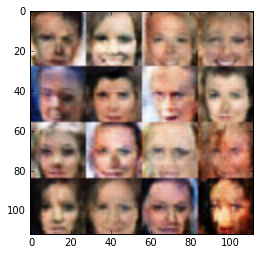

Epoch 1/5... Discriminator Loss: 1.5448... Generator Loss: 0.3203
Epoch 1/5... Discriminator Loss: 1.1041... Generator Loss: 1.0662
Epoch 1/5... Discriminator Loss: 0.9702... Generator Loss: 0.9594
Epoch 1/5... Discriminator Loss: 1.3168... Generator Loss: 0.7920
Epoch 1/5... Discriminator Loss: 1.1092... Generator Loss: 0.8156
Epoch 1/5... Discriminator Loss: 1.3499... Generator Loss: 0.4568
Epoch 1/5... Discriminator Loss: 1.1793... Generator Loss: 0.8441
Epoch 1/5... Discriminator Loss: 1.1366... Generator Loss: 0.8690
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 1.3880
Epoch 1/5... Discriminator Loss: 1.2235... Generator Loss: 0.7118


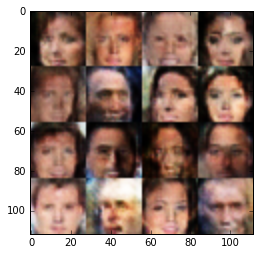

Epoch 1/5... Discriminator Loss: 1.2348... Generator Loss: 0.5852
Epoch 1/5... Discriminator Loss: 1.2260... Generator Loss: 0.8940
Epoch 1/5... Discriminator Loss: 1.5183... Generator Loss: 0.3789
Epoch 1/5... Discriminator Loss: 1.1615... Generator Loss: 1.0412
Epoch 1/5... Discriminator Loss: 1.2057... Generator Loss: 1.3789
Epoch 1/5... Discriminator Loss: 1.2692... Generator Loss: 0.5824
Epoch 1/5... Discriminator Loss: 1.7790... Generator Loss: 0.2600
Epoch 1/5... Discriminator Loss: 1.1450... Generator Loss: 0.7702
Epoch 1/5... Discriminator Loss: 1.1106... Generator Loss: 1.1340
Epoch 1/5... Discriminator Loss: 1.1935... Generator Loss: 1.0255


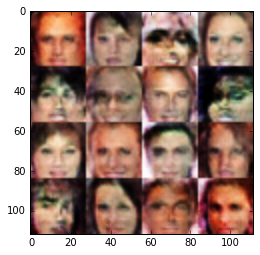

Epoch 1/5... Discriminator Loss: 1.1263... Generator Loss: 0.8461
Epoch 1/5... Discriminator Loss: 1.0423... Generator Loss: 0.9008
Epoch 1/5... Discriminator Loss: 1.2204... Generator Loss: 0.7151
Epoch 1/5... Discriminator Loss: 1.1943... Generator Loss: 1.0454
Epoch 1/5... Discriminator Loss: 1.1894... Generator Loss: 1.0927
Epoch 1/5... Discriminator Loss: 1.0668... Generator Loss: 0.7145
Epoch 1/5... Discriminator Loss: 1.2700... Generator Loss: 1.0141
Epoch 1/5... Discriminator Loss: 1.1555... Generator Loss: 0.6887
Epoch 1/5... Discriminator Loss: 1.1201... Generator Loss: 0.8806
Epoch 1/5... Discriminator Loss: 1.2792... Generator Loss: 1.3446


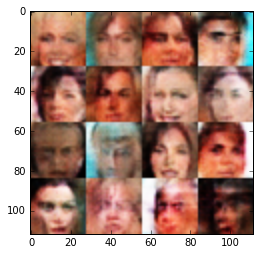

Epoch 1/5... Discriminator Loss: 1.2696... Generator Loss: 0.7865
Epoch 1/5... Discriminator Loss: 1.2820... Generator Loss: 1.4665
Epoch 1/5... Discriminator Loss: 1.2469... Generator Loss: 0.6198
Epoch 1/5... Discriminator Loss: 1.4702... Generator Loss: 0.3991
Epoch 1/5... Discriminator Loss: 1.2186... Generator Loss: 0.9918
Epoch 1/5... Discriminator Loss: 1.3293... Generator Loss: 1.6123
Epoch 1/5... Discriminator Loss: 1.1792... Generator Loss: 0.7078
Epoch 1/5... Discriminator Loss: 1.5224... Generator Loss: 0.3639
Epoch 1/5... Discriminator Loss: 1.1576... Generator Loss: 1.1533
Epoch 1/5... Discriminator Loss: 1.3557... Generator Loss: 0.4683


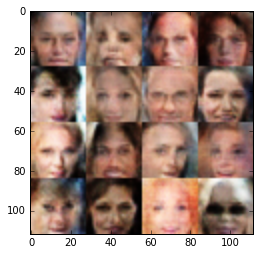

Epoch 1/5... Discriminator Loss: 1.1266... Generator Loss: 0.8800
Epoch 1/5... Discriminator Loss: 1.5251... Generator Loss: 0.3772
Epoch 1/5... Discriminator Loss: 1.3192... Generator Loss: 0.4793
Epoch 1/5... Discriminator Loss: 1.1030... Generator Loss: 0.9354
Epoch 1/5... Discriminator Loss: 1.2699... Generator Loss: 0.5767
Epoch 1/5... Discriminator Loss: 1.0582... Generator Loss: 0.8275
Epoch 1/5... Discriminator Loss: 1.4857... Generator Loss: 0.3936
Epoch 1/5... Discriminator Loss: 1.0944... Generator Loss: 0.9003
Epoch 1/5... Discriminator Loss: 1.3004... Generator Loss: 0.4715
Epoch 1/5... Discriminator Loss: 1.1990... Generator Loss: 0.6960


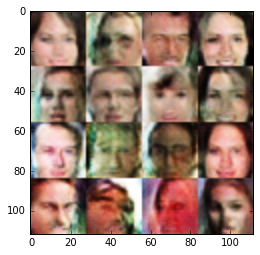

Epoch 1/5... Discriminator Loss: 1.1257... Generator Loss: 0.9862
Epoch 1/5... Discriminator Loss: 1.1427... Generator Loss: 0.9522
Epoch 1/5... Discriminator Loss: 1.3959... Generator Loss: 1.4634
Epoch 1/5... Discriminator Loss: 1.4826... Generator Loss: 0.3722
Epoch 1/5... Discriminator Loss: 1.2048... Generator Loss: 1.2528
Epoch 1/5... Discriminator Loss: 1.2784... Generator Loss: 1.5798
Epoch 1/5... Discriminator Loss: 1.3420... Generator Loss: 0.4286
Epoch 1/5... Discriminator Loss: 1.3191... Generator Loss: 1.0075
Epoch 1/5... Discriminator Loss: 1.3647... Generator Loss: 0.4136
Epoch 1/5... Discriminator Loss: 1.3591... Generator Loss: 0.4840


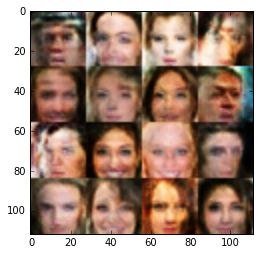

Epoch 1/5... Discriminator Loss: 1.3759... Generator Loss: 0.4379
Epoch 1/5... Discriminator Loss: 1.1690... Generator Loss: 0.9351
Epoch 1/5... Discriminator Loss: 1.3067... Generator Loss: 0.4862
Epoch 1/5... Discriminator Loss: 1.4555... Generator Loss: 0.4031
Epoch 1/5... Discriminator Loss: 1.4607... Generator Loss: 0.9655
Epoch 1/5... Discriminator Loss: 1.4346... Generator Loss: 0.3818
Epoch 1/5... Discriminator Loss: 1.5588... Generator Loss: 0.5148
Epoch 1/5... Discriminator Loss: 1.2533... Generator Loss: 0.6283
Epoch 1/5... Discriminator Loss: 1.6626... Generator Loss: 0.2914
Epoch 1/5... Discriminator Loss: 1.2693... Generator Loss: 0.6118


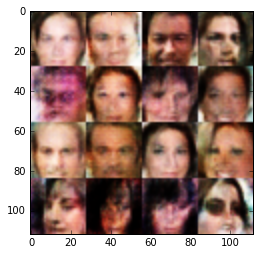

Epoch 1/5... Discriminator Loss: 1.1530... Generator Loss: 1.2421
Epoch 1/5... Discriminator Loss: 1.4247... Generator Loss: 0.3966
Epoch 1/5... Discriminator Loss: 1.1768... Generator Loss: 0.8577
Epoch 1/5... Discriminator Loss: 1.0945... Generator Loss: 0.8972
Epoch 1/5... Discriminator Loss: 1.1857... Generator Loss: 0.8131
Epoch 1/5... Discriminator Loss: 1.1138... Generator Loss: 1.1240
Epoch 1/5... Discriminator Loss: 1.2566... Generator Loss: 0.5964
Epoch 1/5... Discriminator Loss: 1.5020... Generator Loss: 0.3777
Epoch 1/5... Discriminator Loss: 1.3500... Generator Loss: 1.1014
Epoch 1/5... Discriminator Loss: 1.2525... Generator Loss: 1.2921


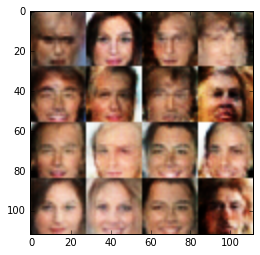

Epoch 1/5... Discriminator Loss: 1.3195... Generator Loss: 1.4058
Epoch 1/5... Discriminator Loss: 1.1940... Generator Loss: 0.6375
Epoch 1/5... Discriminator Loss: 1.4342... Generator Loss: 0.6708
Epoch 1/5... Discriminator Loss: 1.3635... Generator Loss: 0.5654
Epoch 1/5... Discriminator Loss: 1.1029... Generator Loss: 0.9234
Epoch 1/5... Discriminator Loss: 1.1384... Generator Loss: 0.7489
Epoch 1/5... Discriminator Loss: 1.1339... Generator Loss: 0.8607
Epoch 1/5... Discriminator Loss: 1.0648... Generator Loss: 0.9971
Epoch 1/5... Discriminator Loss: 1.2585... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 1.3255... Generator Loss: 0.5607


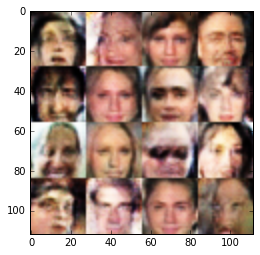

Epoch 1/5... Discriminator Loss: 1.1127... Generator Loss: 1.1644
Epoch 1/5... Discriminator Loss: 1.3129... Generator Loss: 0.4712
Epoch 1/5... Discriminator Loss: 1.2496... Generator Loss: 0.6866
Epoch 1/5... Discriminator Loss: 1.5058... Generator Loss: 0.3422
Epoch 1/5... Discriminator Loss: 1.1747... Generator Loss: 1.2083
Epoch 1/5... Discriminator Loss: 1.3576... Generator Loss: 0.4442
Epoch 1/5... Discriminator Loss: 1.3801... Generator Loss: 0.4206
Epoch 2/5... Discriminator Loss: 1.1543... Generator Loss: 1.0049
Epoch 2/5... Discriminator Loss: 1.2652... Generator Loss: 0.8666
Epoch 2/5... Discriminator Loss: 1.1417... Generator Loss: 1.0301


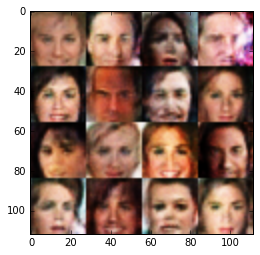

Epoch 2/5... Discriminator Loss: 1.2752... Generator Loss: 0.5989
Epoch 2/5... Discriminator Loss: 1.1545... Generator Loss: 0.8444
Epoch 2/5... Discriminator Loss: 1.3096... Generator Loss: 0.6627
Epoch 2/5... Discriminator Loss: 1.1560... Generator Loss: 0.8441
Epoch 2/5... Discriminator Loss: 1.1180... Generator Loss: 0.8478
Epoch 2/5... Discriminator Loss: 1.1392... Generator Loss: 0.8046
Epoch 2/5... Discriminator Loss: 1.2110... Generator Loss: 0.7110
Epoch 2/5... Discriminator Loss: 1.3183... Generator Loss: 0.7427
Epoch 2/5... Discriminator Loss: 1.1275... Generator Loss: 0.7236
Epoch 2/5... Discriminator Loss: 1.3039... Generator Loss: 0.8277


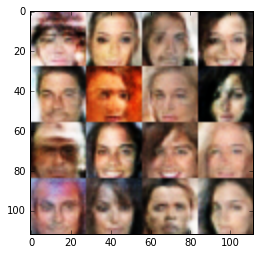

Epoch 2/5... Discriminator Loss: 1.2843... Generator Loss: 0.6217
Epoch 2/5... Discriminator Loss: 1.1632... Generator Loss: 0.7220
Epoch 2/5... Discriminator Loss: 1.2118... Generator Loss: 0.8298
Epoch 2/5... Discriminator Loss: 1.1971... Generator Loss: 0.8472
Epoch 2/5... Discriminator Loss: 1.2551... Generator Loss: 1.0843
Epoch 2/5... Discriminator Loss: 1.4036... Generator Loss: 0.4391
Epoch 2/5... Discriminator Loss: 1.1473... Generator Loss: 0.8694
Epoch 2/5... Discriminator Loss: 1.4275... Generator Loss: 0.3741
Epoch 2/5... Discriminator Loss: 1.2008... Generator Loss: 0.8499
Epoch 2/5... Discriminator Loss: 1.1699... Generator Loss: 0.8250


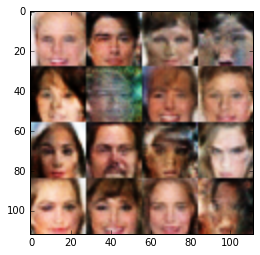

Epoch 2/5... Discriminator Loss: 1.2491... Generator Loss: 0.5246
Epoch 2/5... Discriminator Loss: 1.5974... Generator Loss: 0.3177
Epoch 2/5... Discriminator Loss: 1.1824... Generator Loss: 0.6093
Epoch 2/5... Discriminator Loss: 1.1472... Generator Loss: 0.6867
Epoch 2/5... Discriminator Loss: 1.6917... Generator Loss: 0.2647
Epoch 2/5... Discriminator Loss: 1.3796... Generator Loss: 0.7472
Epoch 2/5... Discriminator Loss: 1.1241... Generator Loss: 0.9290
Epoch 2/5... Discriminator Loss: 1.2662... Generator Loss: 1.0325
Epoch 2/5... Discriminator Loss: 1.1862... Generator Loss: 0.6312
Epoch 2/5... Discriminator Loss: 1.5605... Generator Loss: 0.3172


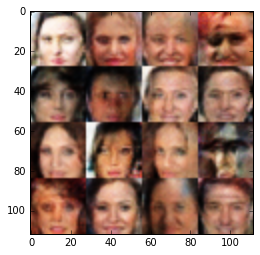

Epoch 2/5... Discriminator Loss: 1.2414... Generator Loss: 0.8775
Epoch 2/5... Discriminator Loss: 1.1900... Generator Loss: 1.0562
Epoch 2/5... Discriminator Loss: 1.1081... Generator Loss: 0.8174
Epoch 2/5... Discriminator Loss: 1.5730... Generator Loss: 0.3276
Epoch 2/5... Discriminator Loss: 1.0587... Generator Loss: 0.9284
Epoch 2/5... Discriminator Loss: 1.2387... Generator Loss: 0.9814
Epoch 2/5... Discriminator Loss: 1.4051... Generator Loss: 1.3285
Epoch 2/5... Discriminator Loss: 1.1649... Generator Loss: 0.8491
Epoch 2/5... Discriminator Loss: 1.3985... Generator Loss: 1.4798
Epoch 2/5... Discriminator Loss: 1.2577... Generator Loss: 1.1818


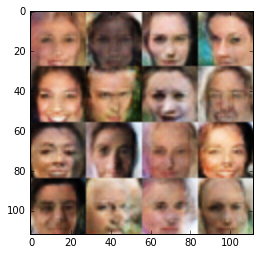

Epoch 2/5... Discriminator Loss: 1.2259... Generator Loss: 0.5905
Epoch 2/5... Discriminator Loss: 1.6326... Generator Loss: 0.3200
Epoch 2/5... Discriminator Loss: 1.1981... Generator Loss: 1.0427
Epoch 2/5... Discriminator Loss: 1.2108... Generator Loss: 0.6390
Epoch 2/5... Discriminator Loss: 1.5709... Generator Loss: 0.3066
Epoch 2/5... Discriminator Loss: 1.2228... Generator Loss: 0.6949
Epoch 2/5... Discriminator Loss: 1.7152... Generator Loss: 0.2733
Epoch 2/5... Discriminator Loss: 1.1678... Generator Loss: 0.7054
Epoch 2/5... Discriminator Loss: 1.2590... Generator Loss: 1.0191
Epoch 2/5... Discriminator Loss: 1.4184... Generator Loss: 0.4451


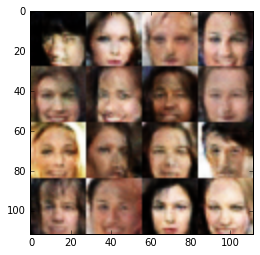

Epoch 2/5... Discriminator Loss: 1.2862... Generator Loss: 0.5426
Epoch 2/5... Discriminator Loss: 1.2643... Generator Loss: 1.2419
Epoch 2/5... Discriminator Loss: 1.5863... Generator Loss: 0.3205
Epoch 2/5... Discriminator Loss: 1.2050... Generator Loss: 0.7025
Epoch 2/5... Discriminator Loss: 1.3549... Generator Loss: 0.5162
Epoch 2/5... Discriminator Loss: 1.4369... Generator Loss: 1.6115
Epoch 2/5... Discriminator Loss: 1.2045... Generator Loss: 0.6807
Epoch 2/5... Discriminator Loss: 1.2760... Generator Loss: 0.4680
Epoch 2/5... Discriminator Loss: 1.2602... Generator Loss: 0.6072
Epoch 2/5... Discriminator Loss: 1.3538... Generator Loss: 0.5411


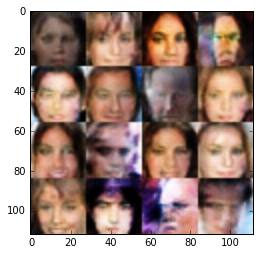

Epoch 2/5... Discriminator Loss: 1.2314... Generator Loss: 1.3691
Epoch 2/5... Discriminator Loss: 1.1320... Generator Loss: 0.7430
Epoch 2/5... Discriminator Loss: 1.7600... Generator Loss: 0.2435
Epoch 2/5... Discriminator Loss: 1.2273... Generator Loss: 0.7604
Epoch 2/5... Discriminator Loss: 1.6196... Generator Loss: 0.2943
Epoch 2/5... Discriminator Loss: 1.1064... Generator Loss: 1.2453
Epoch 2/5... Discriminator Loss: 1.1443... Generator Loss: 0.7121
Epoch 2/5... Discriminator Loss: 1.2876... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3621... Generator Loss: 0.6440
Epoch 2/5... Discriminator Loss: 1.1722... Generator Loss: 0.7966


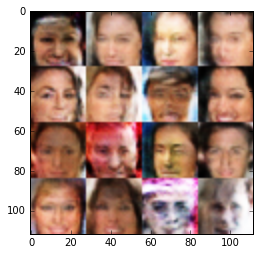

Epoch 2/5... Discriminator Loss: 1.5323... Generator Loss: 0.3414
Epoch 2/5... Discriminator Loss: 1.1630... Generator Loss: 0.7473
Epoch 2/5... Discriminator Loss: 1.3489... Generator Loss: 0.6235
Epoch 2/5... Discriminator Loss: 1.2144... Generator Loss: 0.7591
Epoch 2/5... Discriminator Loss: 1.2081... Generator Loss: 0.9081
Epoch 2/5... Discriminator Loss: 1.5262... Generator Loss: 0.3617
Epoch 2/5... Discriminator Loss: 1.2440... Generator Loss: 0.9454
Epoch 2/5... Discriminator Loss: 1.4535... Generator Loss: 1.3758
Epoch 2/5... Discriminator Loss: 1.2229... Generator Loss: 0.7180
Epoch 2/5... Discriminator Loss: 1.2580... Generator Loss: 0.6275


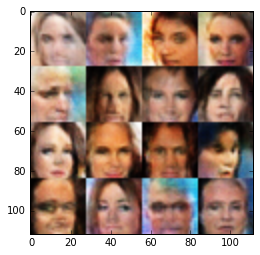

Epoch 2/5... Discriminator Loss: 1.7409... Generator Loss: 0.2708
Epoch 2/5... Discriminator Loss: 1.3927... Generator Loss: 0.4764
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.4146
Epoch 2/5... Discriminator Loss: 1.4732... Generator Loss: 1.5214
Epoch 2/5... Discriminator Loss: 1.1890... Generator Loss: 1.0008
Epoch 2/5... Discriminator Loss: 1.1439... Generator Loss: 0.9160
Epoch 2/5... Discriminator Loss: 1.1646... Generator Loss: 0.6099
Epoch 2/5... Discriminator Loss: 1.2673... Generator Loss: 1.2525
Epoch 2/5... Discriminator Loss: 1.2280... Generator Loss: 0.8164
Epoch 2/5... Discriminator Loss: 1.3299... Generator Loss: 0.5054


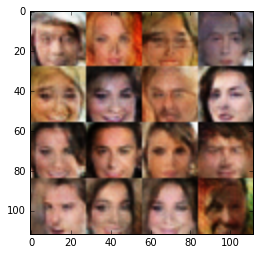

Epoch 2/5... Discriminator Loss: 1.1632... Generator Loss: 0.8640
Epoch 2/5... Discriminator Loss: 1.1478... Generator Loss: 0.7094
Epoch 2/5... Discriminator Loss: 1.0390... Generator Loss: 0.8837
Epoch 2/5... Discriminator Loss: 1.2023... Generator Loss: 1.3924
Epoch 2/5... Discriminator Loss: 1.3098... Generator Loss: 0.8393
Epoch 2/5... Discriminator Loss: 1.2581... Generator Loss: 0.6200
Epoch 2/5... Discriminator Loss: 1.4470... Generator Loss: 0.4038
Epoch 2/5... Discriminator Loss: 1.2403... Generator Loss: 0.7834
Epoch 2/5... Discriminator Loss: 1.2874... Generator Loss: 0.8488
Epoch 2/5... Discriminator Loss: 1.2209... Generator Loss: 0.8730


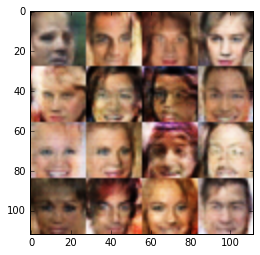

Epoch 2/5... Discriminator Loss: 1.1336... Generator Loss: 0.8206
Epoch 2/5... Discriminator Loss: 1.3488... Generator Loss: 0.5775
Epoch 2/5... Discriminator Loss: 1.2503... Generator Loss: 0.5955
Epoch 2/5... Discriminator Loss: 1.4171... Generator Loss: 0.6196
Epoch 2/5... Discriminator Loss: 1.3140... Generator Loss: 0.7555
Epoch 2/5... Discriminator Loss: 1.0960... Generator Loss: 1.0971
Epoch 2/5... Discriminator Loss: 1.2323... Generator Loss: 0.7093
Epoch 2/5... Discriminator Loss: 1.1319... Generator Loss: 0.8368
Epoch 2/5... Discriminator Loss: 1.4365... Generator Loss: 0.3957
Epoch 2/5... Discriminator Loss: 1.1728... Generator Loss: 1.0972


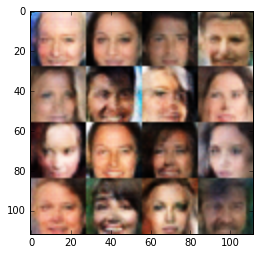

Epoch 2/5... Discriminator Loss: 1.2825... Generator Loss: 1.0153
Epoch 2/5... Discriminator Loss: 1.2448... Generator Loss: 1.1581
Epoch 2/5... Discriminator Loss: 1.3446... Generator Loss: 0.4363
Epoch 2/5... Discriminator Loss: 1.1752... Generator Loss: 1.0696
Epoch 2/5... Discriminator Loss: 1.4959... Generator Loss: 0.7492
Epoch 2/5... Discriminator Loss: 1.2058... Generator Loss: 1.3327
Epoch 2/5... Discriminator Loss: 1.2309... Generator Loss: 0.5175
Epoch 2/5... Discriminator Loss: 1.2462... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.1309... Generator Loss: 0.7807
Epoch 2/5... Discriminator Loss: 1.7378... Generator Loss: 0.2827


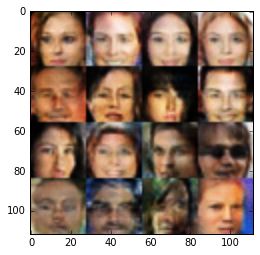

Epoch 2/5... Discriminator Loss: 1.2704... Generator Loss: 0.6104
Epoch 2/5... Discriminator Loss: 1.2216... Generator Loss: 0.8745
Epoch 2/5... Discriminator Loss: 1.4848... Generator Loss: 1.2829
Epoch 2/5... Discriminator Loss: 1.2168... Generator Loss: 0.7164
Epoch 2/5... Discriminator Loss: 1.3833... Generator Loss: 0.4411
Epoch 2/5... Discriminator Loss: 1.2729... Generator Loss: 0.9402
Epoch 2/5... Discriminator Loss: 1.1680... Generator Loss: 0.6668
Epoch 2/5... Discriminator Loss: 1.3477... Generator Loss: 0.6263
Epoch 2/5... Discriminator Loss: 1.1291... Generator Loss: 0.9060
Epoch 2/5... Discriminator Loss: 1.3712... Generator Loss: 0.9330


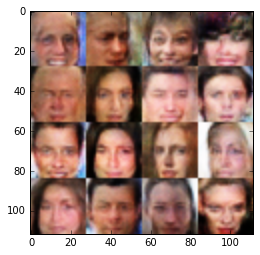

Epoch 2/5... Discriminator Loss: 1.1663... Generator Loss: 0.9457
Epoch 2/5... Discriminator Loss: 1.2639... Generator Loss: 0.6931
Epoch 2/5... Discriminator Loss: 1.1909... Generator Loss: 0.9964
Epoch 2/5... Discriminator Loss: 1.1926... Generator Loss: 0.7727
Epoch 2/5... Discriminator Loss: 1.2790... Generator Loss: 0.5120
Epoch 2/5... Discriminator Loss: 1.2445... Generator Loss: 0.5645
Epoch 2/5... Discriminator Loss: 1.0852... Generator Loss: 0.8273
Epoch 2/5... Discriminator Loss: 1.2534... Generator Loss: 1.1814
Epoch 2/5... Discriminator Loss: 1.1767... Generator Loss: 0.8590
Epoch 2/5... Discriminator Loss: 1.2856... Generator Loss: 0.9522


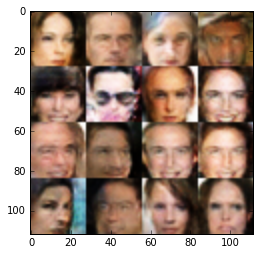

Epoch 2/5... Discriminator Loss: 1.3715... Generator Loss: 0.4573
Epoch 2/5... Discriminator Loss: 1.1065... Generator Loss: 0.9971
Epoch 2/5... Discriminator Loss: 1.2141... Generator Loss: 0.6052
Epoch 2/5... Discriminator Loss: 1.3215... Generator Loss: 1.3331
Epoch 2/5... Discriminator Loss: 1.4901... Generator Loss: 1.2959
Epoch 2/5... Discriminator Loss: 1.2430... Generator Loss: 0.6546
Epoch 2/5... Discriminator Loss: 1.2652... Generator Loss: 0.4766
Epoch 2/5... Discriminator Loss: 1.3714... Generator Loss: 0.6391
Epoch 2/5... Discriminator Loss: 1.2164... Generator Loss: 0.7470
Epoch 2/5... Discriminator Loss: 1.5376... Generator Loss: 0.3242


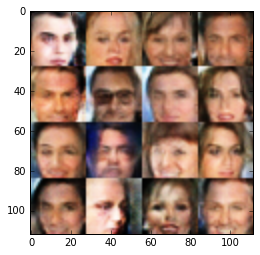

Epoch 2/5... Discriminator Loss: 1.2707... Generator Loss: 0.6659
Epoch 2/5... Discriminator Loss: 1.2100... Generator Loss: 0.9181
Epoch 2/5... Discriminator Loss: 1.4260... Generator Loss: 0.7538
Epoch 2/5... Discriminator Loss: 1.3762... Generator Loss: 0.4588
Epoch 2/5... Discriminator Loss: 1.1588... Generator Loss: 0.6427
Epoch 3/5... Discriminator Loss: 1.2304... Generator Loss: 0.9091
Epoch 3/5... Discriminator Loss: 1.2033... Generator Loss: 0.9700
Epoch 3/5... Discriminator Loss: 1.4141... Generator Loss: 1.2736
Epoch 3/5... Discriminator Loss: 1.3130... Generator Loss: 0.5197
Epoch 3/5... Discriminator Loss: 1.1528... Generator Loss: 0.9919


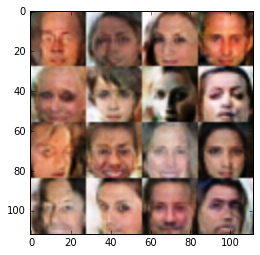

Epoch 3/5... Discriminator Loss: 1.3171... Generator Loss: 0.5001
Epoch 3/5... Discriminator Loss: 1.2457... Generator Loss: 0.6408
Epoch 3/5... Discriminator Loss: 1.1752... Generator Loss: 0.9119
Epoch 3/5... Discriminator Loss: 1.2112... Generator Loss: 0.6936
Epoch 3/5... Discriminator Loss: 1.2592... Generator Loss: 1.1191
Epoch 3/5... Discriminator Loss: 1.1631... Generator Loss: 0.9988
Epoch 3/5... Discriminator Loss: 1.3161... Generator Loss: 1.6685
Epoch 3/5... Discriminator Loss: 1.2829... Generator Loss: 0.5120
Epoch 3/5... Discriminator Loss: 1.2371... Generator Loss: 0.7391
Epoch 3/5... Discriminator Loss: 1.5708... Generator Loss: 1.6963


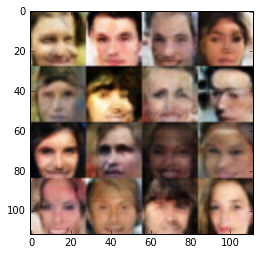

Epoch 3/5... Discriminator Loss: 1.1851... Generator Loss: 0.7590
Epoch 3/5... Discriminator Loss: 1.2078... Generator Loss: 0.6581
Epoch 3/5... Discriminator Loss: 1.7966... Generator Loss: 0.2460
Epoch 3/5... Discriminator Loss: 1.2493... Generator Loss: 0.5356
Epoch 3/5... Discriminator Loss: 1.2293... Generator Loss: 1.0754
Epoch 3/5... Discriminator Loss: 1.2711... Generator Loss: 0.5298
Epoch 3/5... Discriminator Loss: 1.5300... Generator Loss: 1.4828
Epoch 3/5... Discriminator Loss: 1.1084... Generator Loss: 1.0841
Epoch 3/5... Discriminator Loss: 1.3240... Generator Loss: 0.4987
Epoch 3/5... Discriminator Loss: 1.3381... Generator Loss: 0.6019


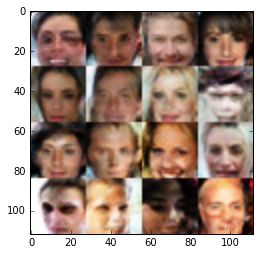

Epoch 3/5... Discriminator Loss: 1.1834... Generator Loss: 0.6567
Epoch 3/5... Discriminator Loss: 1.1873... Generator Loss: 0.6234
Epoch 3/5... Discriminator Loss: 1.1669... Generator Loss: 1.0067
Epoch 3/5... Discriminator Loss: 1.0419... Generator Loss: 1.0805
Epoch 3/5... Discriminator Loss: 1.1570... Generator Loss: 1.3920
Epoch 3/5... Discriminator Loss: 1.2676... Generator Loss: 1.2164
Epoch 3/5... Discriminator Loss: 1.1694... Generator Loss: 0.8305
Epoch 3/5... Discriminator Loss: 1.3488... Generator Loss: 0.5435
Epoch 3/5... Discriminator Loss: 1.1258... Generator Loss: 0.7214
Epoch 3/5... Discriminator Loss: 1.2361... Generator Loss: 0.9966


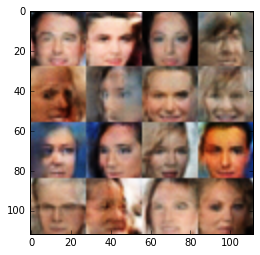

Epoch 3/5... Discriminator Loss: 1.4379... Generator Loss: 0.3838
Epoch 3/5... Discriminator Loss: 1.2508... Generator Loss: 0.5475
Epoch 3/5... Discriminator Loss: 1.2830... Generator Loss: 0.8353
Epoch 3/5... Discriminator Loss: 1.1924... Generator Loss: 1.2152
Epoch 3/5... Discriminator Loss: 1.5771... Generator Loss: 1.4472
Epoch 3/5... Discriminator Loss: 1.2722... Generator Loss: 0.8079
Epoch 3/5... Discriminator Loss: 1.0669... Generator Loss: 1.1629
Epoch 3/5... Discriminator Loss: 1.5361... Generator Loss: 1.3344
Epoch 3/5... Discriminator Loss: 1.1274... Generator Loss: 0.9735
Epoch 3/5... Discriminator Loss: 1.0771... Generator Loss: 0.8133


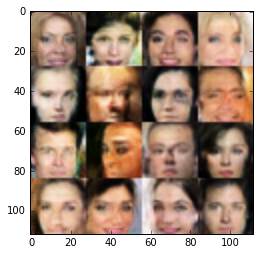

Epoch 3/5... Discriminator Loss: 1.3377... Generator Loss: 1.1769
Epoch 3/5... Discriminator Loss: 1.1912... Generator Loss: 0.9491
Epoch 3/5... Discriminator Loss: 1.3051... Generator Loss: 0.6310
Epoch 3/5... Discriminator Loss: 1.1491... Generator Loss: 1.0512
Epoch 3/5... Discriminator Loss: 1.3689... Generator Loss: 0.4341
Epoch 3/5... Discriminator Loss: 1.1351... Generator Loss: 0.8995
Epoch 3/5... Discriminator Loss: 2.9724... Generator Loss: 1.3890
Epoch 3/5... Discriminator Loss: 1.3485... Generator Loss: 0.5602
Epoch 3/5... Discriminator Loss: 1.1230... Generator Loss: 0.7441
Epoch 3/5... Discriminator Loss: 1.4418... Generator Loss: 1.4942


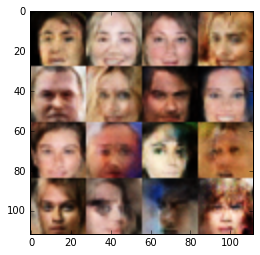

Epoch 3/5... Discriminator Loss: 1.1343... Generator Loss: 0.7369
Epoch 3/5... Discriminator Loss: 1.3381... Generator Loss: 0.4707
Epoch 3/5... Discriminator Loss: 1.1669... Generator Loss: 0.7948
Epoch 3/5... Discriminator Loss: 1.2690... Generator Loss: 1.0505
Epoch 3/5... Discriminator Loss: 1.1557... Generator Loss: 0.8225
Epoch 3/5... Discriminator Loss: 1.1696... Generator Loss: 0.9907
Epoch 3/5... Discriminator Loss: 1.2158... Generator Loss: 1.1069
Epoch 3/5... Discriminator Loss: 1.2014... Generator Loss: 0.8665
Epoch 3/5... Discriminator Loss: 1.1428... Generator Loss: 0.7052
Epoch 3/5... Discriminator Loss: 1.3309... Generator Loss: 0.5188


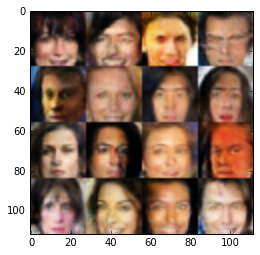

Epoch 3/5... Discriminator Loss: 1.2244... Generator Loss: 0.5921
Epoch 3/5... Discriminator Loss: 1.3315... Generator Loss: 0.4971
Epoch 3/5... Discriminator Loss: 1.5306... Generator Loss: 1.5152
Epoch 3/5... Discriminator Loss: 1.2782... Generator Loss: 1.1336
Epoch 3/5... Discriminator Loss: 1.1587... Generator Loss: 0.7216
Epoch 3/5... Discriminator Loss: 1.0883... Generator Loss: 0.6697
Epoch 3/5... Discriminator Loss: 1.2480... Generator Loss: 1.0154
Epoch 3/5... Discriminator Loss: 1.2610... Generator Loss: 0.5753
Epoch 3/5... Discriminator Loss: 1.2799... Generator Loss: 0.5360
Epoch 3/5... Discriminator Loss: 1.0420... Generator Loss: 1.0140


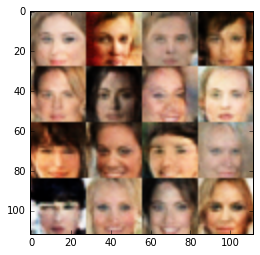

Epoch 3/5... Discriminator Loss: 1.2681... Generator Loss: 0.9405
Epoch 3/5... Discriminator Loss: 1.1899... Generator Loss: 1.2018
Epoch 3/5... Discriminator Loss: 1.3927... Generator Loss: 0.5059
Epoch 3/5... Discriminator Loss: 1.3000... Generator Loss: 0.4966
Epoch 3/5... Discriminator Loss: 1.2109... Generator Loss: 0.7161
Epoch 3/5... Discriminator Loss: 1.3421... Generator Loss: 1.5547
Epoch 3/5... Discriminator Loss: 1.1731... Generator Loss: 1.1447
Epoch 3/5... Discriminator Loss: 1.2139... Generator Loss: 0.6833
Epoch 3/5... Discriminator Loss: 1.3019... Generator Loss: 0.6233
Epoch 3/5... Discriminator Loss: 1.3393... Generator Loss: 0.4499


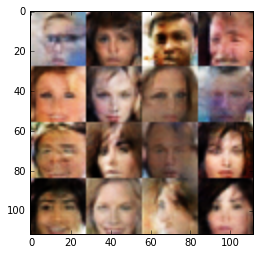

Epoch 3/5... Discriminator Loss: 1.3127... Generator Loss: 0.5352
Epoch 3/5... Discriminator Loss: 1.0627... Generator Loss: 0.8808
Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.5494
Epoch 3/5... Discriminator Loss: 1.1152... Generator Loss: 1.0340
Epoch 3/5... Discriminator Loss: 1.1497... Generator Loss: 0.7954
Epoch 3/5... Discriminator Loss: 1.2641... Generator Loss: 1.2362
Epoch 3/5... Discriminator Loss: 1.4833... Generator Loss: 1.3268
Epoch 3/5... Discriminator Loss: 1.2050... Generator Loss: 1.0052
Epoch 3/5... Discriminator Loss: 1.1034... Generator Loss: 0.8664
Epoch 3/5... Discriminator Loss: 1.1410... Generator Loss: 0.8116


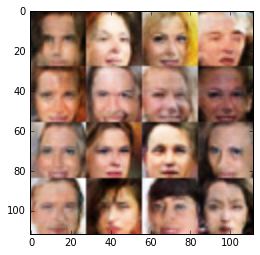

Epoch 3/5... Discriminator Loss: 1.2551... Generator Loss: 0.5143
Epoch 3/5... Discriminator Loss: 1.0954... Generator Loss: 0.7825
Epoch 3/5... Discriminator Loss: 1.1845... Generator Loss: 0.8547
Epoch 3/5... Discriminator Loss: 1.2842... Generator Loss: 0.6885
Epoch 3/5... Discriminator Loss: 1.2861... Generator Loss: 1.2827
Epoch 3/5... Discriminator Loss: 1.1740... Generator Loss: 0.5544
Epoch 3/5... Discriminator Loss: 1.3329... Generator Loss: 0.5136
Epoch 3/5... Discriminator Loss: 1.0958... Generator Loss: 0.7279
Epoch 3/5... Discriminator Loss: 1.0102... Generator Loss: 1.1905
Epoch 3/5... Discriminator Loss: 1.4296... Generator Loss: 0.9096


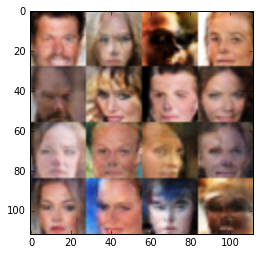

Epoch 3/5... Discriminator Loss: 1.2838... Generator Loss: 0.5007
Epoch 3/5... Discriminator Loss: 1.2646... Generator Loss: 0.6842
Epoch 3/5... Discriminator Loss: 1.3043... Generator Loss: 0.5872
Epoch 3/5... Discriminator Loss: 1.2690... Generator Loss: 0.7053
Epoch 3/5... Discriminator Loss: 1.2623... Generator Loss: 0.5427
Epoch 3/5... Discriminator Loss: 1.1128... Generator Loss: 0.8626
Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.8697
Epoch 3/5... Discriminator Loss: 1.1985... Generator Loss: 0.9825
Epoch 3/5... Discriminator Loss: 1.2492... Generator Loss: 0.5453
Epoch 3/5... Discriminator Loss: 1.1077... Generator Loss: 1.0173


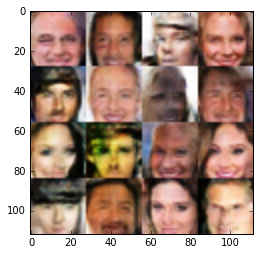

Epoch 3/5... Discriminator Loss: 1.2493... Generator Loss: 0.6011
Epoch 3/5... Discriminator Loss: 1.3364... Generator Loss: 1.4567
Epoch 3/5... Discriminator Loss: 1.2849... Generator Loss: 0.5157
Epoch 3/5... Discriminator Loss: 1.1718... Generator Loss: 1.1363
Epoch 3/5... Discriminator Loss: 1.3623... Generator Loss: 0.5677
Epoch 3/5... Discriminator Loss: 1.2541... Generator Loss: 1.1892
Epoch 3/5... Discriminator Loss: 1.1407... Generator Loss: 0.8185
Epoch 3/5... Discriminator Loss: 1.1270... Generator Loss: 1.0466
Epoch 3/5... Discriminator Loss: 1.2169... Generator Loss: 1.2832
Epoch 3/5... Discriminator Loss: 1.1071... Generator Loss: 1.1621


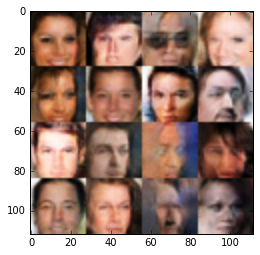

Epoch 3/5... Discriminator Loss: 1.0105... Generator Loss: 1.0785
Epoch 3/5... Discriminator Loss: 1.1499... Generator Loss: 0.8007
Epoch 3/5... Discriminator Loss: 1.4369... Generator Loss: 1.3527
Epoch 3/5... Discriminator Loss: 1.0664... Generator Loss: 0.8762
Epoch 3/5... Discriminator Loss: 1.2567... Generator Loss: 0.5727
Epoch 3/5... Discriminator Loss: 1.0032... Generator Loss: 1.1188
Epoch 3/5... Discriminator Loss: 1.2990... Generator Loss: 0.9290
Epoch 3/5... Discriminator Loss: 1.1801... Generator Loss: 0.9192
Epoch 3/5... Discriminator Loss: 1.1094... Generator Loss: 0.6702
Epoch 3/5... Discriminator Loss: 1.0170... Generator Loss: 0.9711


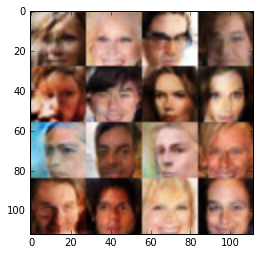

Epoch 3/5... Discriminator Loss: 1.3010... Generator Loss: 1.2673
Epoch 3/5... Discriminator Loss: 1.2759... Generator Loss: 0.5529
Epoch 3/5... Discriminator Loss: 1.1997... Generator Loss: 0.8519
Epoch 3/5... Discriminator Loss: 1.2319... Generator Loss: 0.6643
Epoch 3/5... Discriminator Loss: 1.3897... Generator Loss: 0.4479
Epoch 3/5... Discriminator Loss: 1.4853... Generator Loss: 1.2972
Epoch 3/5... Discriminator Loss: 1.1945... Generator Loss: 0.5615
Epoch 3/5... Discriminator Loss: 1.1366... Generator Loss: 0.8007
Epoch 3/5... Discriminator Loss: 1.4229... Generator Loss: 0.4238
Epoch 3/5... Discriminator Loss: 1.2725... Generator Loss: 0.4814


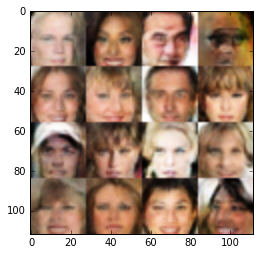

Epoch 3/5... Discriminator Loss: 1.6653... Generator Loss: 0.2797
Epoch 3/5... Discriminator Loss: 1.2284... Generator Loss: 0.9415
Epoch 3/5... Discriminator Loss: 1.6111... Generator Loss: 0.3133
Epoch 3/5... Discriminator Loss: 1.1793... Generator Loss: 1.0919
Epoch 3/5... Discriminator Loss: 1.4837... Generator Loss: 0.3776
Epoch 3/5... Discriminator Loss: 1.2787... Generator Loss: 0.5134
Epoch 3/5... Discriminator Loss: 1.3369... Generator Loss: 1.4345
Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.5904
Epoch 3/5... Discriminator Loss: 1.2614... Generator Loss: 1.0346
Epoch 3/5... Discriminator Loss: 1.4158... Generator Loss: 0.4596


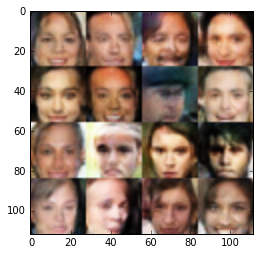

Epoch 3/5... Discriminator Loss: 1.2074... Generator Loss: 0.7684
Epoch 3/5... Discriminator Loss: 1.1977... Generator Loss: 0.7979
Epoch 3/5... Discriminator Loss: 1.1093... Generator Loss: 0.8029
Epoch 4/5... Discriminator Loss: 1.4547... Generator Loss: 0.4144
Epoch 4/5... Discriminator Loss: 1.6164... Generator Loss: 1.8290
Epoch 4/5... Discriminator Loss: 1.1252... Generator Loss: 0.8650
Epoch 4/5... Discriminator Loss: 1.2419... Generator Loss: 0.8505
Epoch 4/5... Discriminator Loss: 1.4146... Generator Loss: 0.3800
Epoch 4/5... Discriminator Loss: 1.7362... Generator Loss: 0.2656
Epoch 4/5... Discriminator Loss: 1.2853... Generator Loss: 0.5858


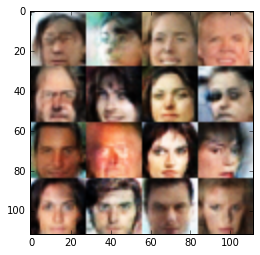

Epoch 4/5... Discriminator Loss: 1.2718... Generator Loss: 0.5870
Epoch 4/5... Discriminator Loss: 1.5429... Generator Loss: 0.3150
Epoch 4/5... Discriminator Loss: 1.1873... Generator Loss: 0.7231
Epoch 4/5... Discriminator Loss: 1.2896... Generator Loss: 0.7670
Epoch 4/5... Discriminator Loss: 1.4276... Generator Loss: 0.3864
Epoch 4/5... Discriminator Loss: 1.6564... Generator Loss: 0.3063
Epoch 4/5... Discriminator Loss: 1.3648... Generator Loss: 0.4087
Epoch 4/5... Discriminator Loss: 1.1813... Generator Loss: 0.7144
Epoch 4/5... Discriminator Loss: 1.3488... Generator Loss: 0.4442
Epoch 4/5... Discriminator Loss: 1.2187... Generator Loss: 0.5088


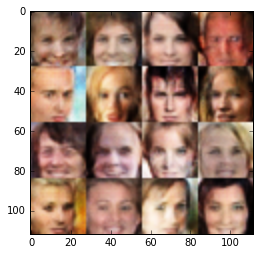

Epoch 4/5... Discriminator Loss: 1.3495... Generator Loss: 1.4023
Epoch 4/5... Discriminator Loss: 1.2281... Generator Loss: 0.7371
Epoch 4/5... Discriminator Loss: 1.2006... Generator Loss: 0.6666
Epoch 4/5... Discriminator Loss: 1.4010... Generator Loss: 0.4611
Epoch 4/5... Discriminator Loss: 0.9845... Generator Loss: 1.2348
Epoch 4/5... Discriminator Loss: 1.0955... Generator Loss: 0.6694
Epoch 4/5... Discriminator Loss: 1.3162... Generator Loss: 1.3883
Epoch 4/5... Discriminator Loss: 1.7747... Generator Loss: 0.2282
Epoch 4/5... Discriminator Loss: 1.2314... Generator Loss: 0.5609
Epoch 4/5... Discriminator Loss: 1.1400... Generator Loss: 0.6604


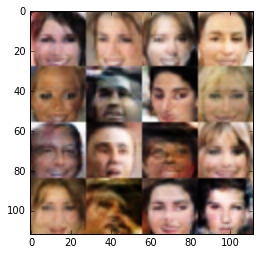

Epoch 4/5... Discriminator Loss: 1.3227... Generator Loss: 0.4545
Epoch 4/5... Discriminator Loss: 1.1441... Generator Loss: 0.6748
Epoch 4/5... Discriminator Loss: 1.1653... Generator Loss: 0.6713
Epoch 4/5... Discriminator Loss: 1.1880... Generator Loss: 1.4509
Epoch 4/5... Discriminator Loss: 1.2278... Generator Loss: 0.7316
Epoch 4/5... Discriminator Loss: 1.4109... Generator Loss: 0.4058
Epoch 4/5... Discriminator Loss: 1.1086... Generator Loss: 0.7406
Epoch 4/5... Discriminator Loss: 1.1463... Generator Loss: 0.8618
Epoch 4/5... Discriminator Loss: 1.3916... Generator Loss: 0.6539
Epoch 4/5... Discriminator Loss: 1.2494... Generator Loss: 0.8535


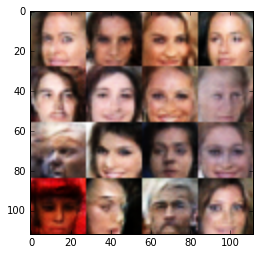

Epoch 4/5... Discriminator Loss: 1.5515... Generator Loss: 0.7206
Epoch 4/5... Discriminator Loss: 1.1568... Generator Loss: 0.6563
Epoch 4/5... Discriminator Loss: 1.2199... Generator Loss: 0.6950
Epoch 4/5... Discriminator Loss: 1.3046... Generator Loss: 0.4871
Epoch 4/5... Discriminator Loss: 1.0056... Generator Loss: 0.7903
Epoch 4/5... Discriminator Loss: 1.1761... Generator Loss: 0.8372
Epoch 4/5... Discriminator Loss: 1.1436... Generator Loss: 1.4594
Epoch 4/5... Discriminator Loss: 1.2298... Generator Loss: 0.6456
Epoch 4/5... Discriminator Loss: 1.1432... Generator Loss: 0.7899
Epoch 4/5... Discriminator Loss: 1.2671... Generator Loss: 0.5734


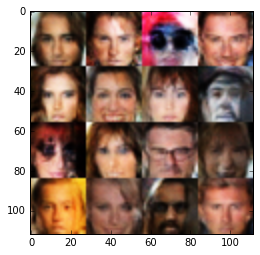

Epoch 4/5... Discriminator Loss: 1.0560... Generator Loss: 0.8157
Epoch 4/5... Discriminator Loss: 1.3134... Generator Loss: 1.5020
Epoch 4/5... Discriminator Loss: 1.1664... Generator Loss: 0.6139
Epoch 4/5... Discriminator Loss: 1.1427... Generator Loss: 0.7507
Epoch 4/5... Discriminator Loss: 1.5055... Generator Loss: 0.3557
Epoch 4/5... Discriminator Loss: 1.3234... Generator Loss: 0.4647
Epoch 4/5... Discriminator Loss: 1.1680... Generator Loss: 0.7727
Epoch 4/5... Discriminator Loss: 1.2914... Generator Loss: 0.9521
Epoch 4/5... Discriminator Loss: 1.2669... Generator Loss: 1.2339
Epoch 4/5... Discriminator Loss: 1.2343... Generator Loss: 1.2333


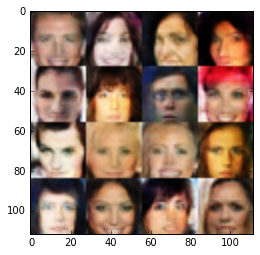

Epoch 4/5... Discriminator Loss: 1.2785... Generator Loss: 0.5136
Epoch 4/5... Discriminator Loss: 0.7117... Generator Loss: 1.1571
Epoch 4/5... Discriminator Loss: 1.3524... Generator Loss: 1.4345
Epoch 4/5... Discriminator Loss: 1.2615... Generator Loss: 0.4520
Epoch 4/5... Discriminator Loss: 1.1551... Generator Loss: 0.8617
Epoch 4/5... Discriminator Loss: 1.0399... Generator Loss: 1.1356
Epoch 4/5... Discriminator Loss: 1.3982... Generator Loss: 0.7481
Epoch 4/5... Discriminator Loss: 0.9316... Generator Loss: 1.2339
Epoch 4/5... Discriminator Loss: 1.2440... Generator Loss: 0.7710
Epoch 4/5... Discriminator Loss: 1.4644... Generator Loss: 0.4052


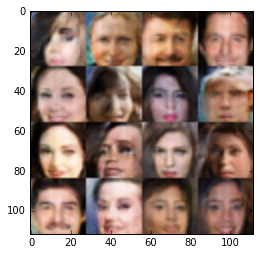

Epoch 4/5... Discriminator Loss: 1.5428... Generator Loss: 1.8118
Epoch 4/5... Discriminator Loss: 1.0595... Generator Loss: 1.0345
Epoch 4/5... Discriminator Loss: 1.3593... Generator Loss: 0.4632
Epoch 4/5... Discriminator Loss: 1.4671... Generator Loss: 0.3969
Epoch 4/5... Discriminator Loss: 1.4100... Generator Loss: 0.4603
Epoch 4/5... Discriminator Loss: 1.1583... Generator Loss: 1.2961
Epoch 4/5... Discriminator Loss: 1.1886... Generator Loss: 0.6068
Epoch 4/5... Discriminator Loss: 1.1065... Generator Loss: 0.7720
Epoch 4/5... Discriminator Loss: 1.0765... Generator Loss: 0.8725
Epoch 4/5... Discriminator Loss: 0.9198... Generator Loss: 0.9437


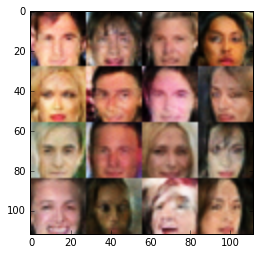

Epoch 4/5... Discriminator Loss: 1.3828... Generator Loss: 0.4138
Epoch 4/5... Discriminator Loss: 1.2878... Generator Loss: 0.4634
Epoch 4/5... Discriminator Loss: 1.4453... Generator Loss: 0.3593
Epoch 4/5... Discriminator Loss: 1.1334... Generator Loss: 1.0176
Epoch 4/5... Discriminator Loss: 1.2394... Generator Loss: 0.5378
Epoch 4/5... Discriminator Loss: 1.3118... Generator Loss: 1.0238
Epoch 4/5... Discriminator Loss: 1.5493... Generator Loss: 0.3811
Epoch 4/5... Discriminator Loss: 0.9739... Generator Loss: 0.7293
Epoch 4/5... Discriminator Loss: 0.9928... Generator Loss: 0.8169
Epoch 4/5... Discriminator Loss: 1.0319... Generator Loss: 1.4315


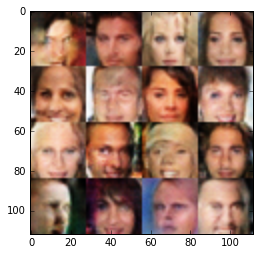

Epoch 4/5... Discriminator Loss: 1.6630... Generator Loss: 0.2658
Epoch 4/5... Discriminator Loss: 1.1789... Generator Loss: 0.9896
Epoch 4/5... Discriminator Loss: 1.0689... Generator Loss: 0.7351
Epoch 4/5... Discriminator Loss: 1.6420... Generator Loss: 1.2572
Epoch 4/5... Discriminator Loss: 1.1361... Generator Loss: 0.9105
Epoch 4/5... Discriminator Loss: 0.9877... Generator Loss: 0.9598
Epoch 4/5... Discriminator Loss: 1.1676... Generator Loss: 1.0964
Epoch 4/5... Discriminator Loss: 1.3288... Generator Loss: 0.4438
Epoch 4/5... Discriminator Loss: 1.5597... Generator Loss: 0.3389
Epoch 4/5... Discriminator Loss: 1.4029... Generator Loss: 1.4013


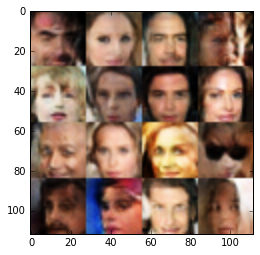

Epoch 4/5... Discriminator Loss: 1.1940... Generator Loss: 0.8079
Epoch 4/5... Discriminator Loss: 1.4183... Generator Loss: 0.6318
Epoch 4/5... Discriminator Loss: 1.0442... Generator Loss: 0.7332
Epoch 4/5... Discriminator Loss: 1.2345... Generator Loss: 0.6425
Epoch 4/5... Discriminator Loss: 1.3441... Generator Loss: 1.3137
Epoch 4/5... Discriminator Loss: 1.2744... Generator Loss: 0.5499
Epoch 4/5... Discriminator Loss: 1.1373... Generator Loss: 1.4530
Epoch 4/5... Discriminator Loss: 1.5130... Generator Loss: 0.3474
Epoch 4/5... Discriminator Loss: 1.3149... Generator Loss: 0.4955
Epoch 4/5... Discriminator Loss: 1.0659... Generator Loss: 0.9060


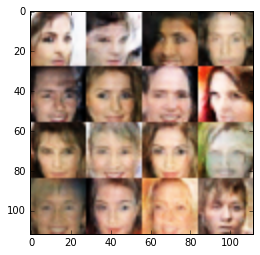

Epoch 4/5... Discriminator Loss: 1.2352... Generator Loss: 1.1783
Epoch 4/5... Discriminator Loss: 1.0632... Generator Loss: 1.0390
Epoch 4/5... Discriminator Loss: 1.1628... Generator Loss: 0.9902
Epoch 4/5... Discriminator Loss: 1.2706... Generator Loss: 0.5791
Epoch 4/5... Discriminator Loss: 1.3580... Generator Loss: 0.4457
Epoch 4/5... Discriminator Loss: 1.2034... Generator Loss: 0.5831
Epoch 4/5... Discriminator Loss: 1.0187... Generator Loss: 1.2139
Epoch 4/5... Discriminator Loss: 1.0228... Generator Loss: 0.8004
Epoch 4/5... Discriminator Loss: 1.3177... Generator Loss: 0.5043
Epoch 4/5... Discriminator Loss: 1.3607... Generator Loss: 0.4804


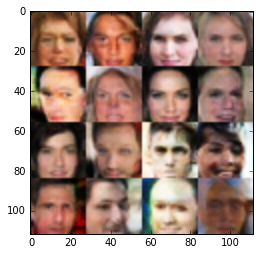

Epoch 4/5... Discriminator Loss: 1.3778... Generator Loss: 0.4668
Epoch 4/5... Discriminator Loss: 1.0440... Generator Loss: 0.9005
Epoch 4/5... Discriminator Loss: 1.1378... Generator Loss: 0.8668
Epoch 4/5... Discriminator Loss: 1.2181... Generator Loss: 0.5824
Epoch 4/5... Discriminator Loss: 1.5904... Generator Loss: 0.3044
Epoch 4/5... Discriminator Loss: 1.2790... Generator Loss: 0.5764
Epoch 4/5... Discriminator Loss: 1.1858... Generator Loss: 0.8451
Epoch 4/5... Discriminator Loss: 1.1535... Generator Loss: 0.8912
Epoch 4/5... Discriminator Loss: 1.4056... Generator Loss: 1.7090
Epoch 4/5... Discriminator Loss: 1.1039... Generator Loss: 0.7656


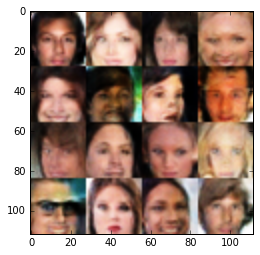

Epoch 4/5... Discriminator Loss: 1.0174... Generator Loss: 1.0370
Epoch 4/5... Discriminator Loss: 1.2568... Generator Loss: 0.6686
Epoch 4/5... Discriminator Loss: 1.3176... Generator Loss: 0.5565
Epoch 4/5... Discriminator Loss: 1.0435... Generator Loss: 0.6996
Epoch 4/5... Discriminator Loss: 1.1473... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.0327... Generator Loss: 0.7868
Epoch 4/5... Discriminator Loss: 1.1620... Generator Loss: 0.9595
Epoch 4/5... Discriminator Loss: 1.2919... Generator Loss: 0.4934
Epoch 4/5... Discriminator Loss: 1.4293... Generator Loss: 0.8381
Epoch 4/5... Discriminator Loss: 1.1479... Generator Loss: 0.6370


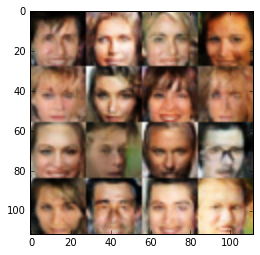

Epoch 4/5... Discriminator Loss: 1.3551... Generator Loss: 0.6247
Epoch 4/5... Discriminator Loss: 1.1884... Generator Loss: 0.7181
Epoch 4/5... Discriminator Loss: 1.0280... Generator Loss: 0.9095
Epoch 4/5... Discriminator Loss: 1.0634... Generator Loss: 1.3523
Epoch 4/5... Discriminator Loss: 1.4040... Generator Loss: 0.3929
Epoch 4/5... Discriminator Loss: 1.2988... Generator Loss: 0.4618
Epoch 4/5... Discriminator Loss: 1.1503... Generator Loss: 0.5486
Epoch 4/5... Discriminator Loss: 1.0542... Generator Loss: 0.8706
Epoch 4/5... Discriminator Loss: 1.2754... Generator Loss: 0.5180
Epoch 4/5... Discriminator Loss: 1.1203... Generator Loss: 1.1596


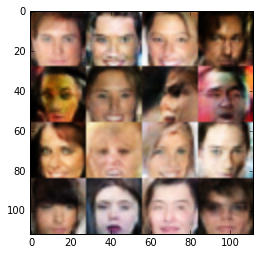

Epoch 4/5... Discriminator Loss: 1.4166... Generator Loss: 0.4024
Epoch 4/5... Discriminator Loss: 1.1386... Generator Loss: 0.7423
Epoch 4/5... Discriminator Loss: 1.3217... Generator Loss: 0.4656
Epoch 4/5... Discriminator Loss: 1.6441... Generator Loss: 0.2893
Epoch 4/5... Discriminator Loss: 1.1093... Generator Loss: 0.7569
Epoch 4/5... Discriminator Loss: 1.3622... Generator Loss: 0.4755
Epoch 4/5... Discriminator Loss: 0.7895... Generator Loss: 1.0753
Epoch 4/5... Discriminator Loss: 1.1706... Generator Loss: 1.0244
Epoch 4/5... Discriminator Loss: 0.9996... Generator Loss: 0.9411
Epoch 4/5... Discriminator Loss: 1.9858... Generator Loss: 0.1874


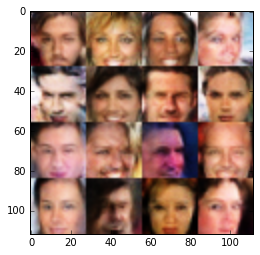

Epoch 4/5... Discriminator Loss: 1.6929... Generator Loss: 1.5426
Epoch 4/5... Discriminator Loss: 1.3886... Generator Loss: 0.4586


In [69]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.